#### TODO: Add a title or descrition

In [1]:
from pathlib import Path
from librep.datasets.har.loaders import PandasMultiModalLoader
from librep.datasets.multimodal import (
    ArrayMultiModalDataset,
    MultiModalDataset,
    TransformMultiModalDataset,
    WindowedTransform,
)
from librep.transforms import FFT 
from librep.xai.xai import (
    train_rf,
    train_svm,
    train_knn,
    train_dt,
    load_dataset,
    shap_values_per_class,
    shap_values_per_feature,
    lime_values_per_class,
    lime_values_per_feature,
)

from sklearn.manifold import TSNE

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

import pickle
import numpy as np
import pandas as pd
from itertools import product, combinations
import os
import scipy.stats

# Fix seed for reproducibility
Seed = 42
np.random.seed(Seed)

# Let's remove the warnings for now
import warnings

warnings.filterwarnings("ignore")

2024-06-20 15:38:20.730924: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-20 15:38:20.768005: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-20 15:38:21.392937: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
standartized_codes = {
    0: "sit",
    1: "stand",
    2: "walk",
    3: "stair up",
    4: "stair down",
    5: "run",
    6: "stair up and down",
}

datasets = [
    "kuhar",
    "motionsense",
    "wisdm",
    "uci",
    "realworld_thigh",
    "realworld_waist",
]

datasets_dict = {
    "kuhar": "KH",
    "motionsense": "MS",
    "wisdm": "WISDM",
    "uci": "UCI",
    "realworld_thigh": "RW Thigh",
    "realworld_waist": "RW Waist",
}

datasets_renamed = [
    "KH",
    "MS",
    "WISDM",
    "UCI",
    "RW Thigh",
    "RW Waist",
]

reduce_on = ["all"]
num_features = 24
activities_per_dataset = {}

# data_path = Path(
#     "/home/patrick/Documents/Repositories/hiaac-m4-experiments/analysis/XAI/reducer_experiments/results/execution/transformed_data"
# )

data_path = Path(
    "../..//experiments/XAI/experiments/KPCA_all/results/execution/transformed_data"
)

for dataset in datasets:
    for reduce in reduce_on:
        train, test = load_dataset(dataset, dataset, reduce, path=data_path)
        labels = np.unique(train.y)

        activities_per_dataset[dataset] = [
            standartized_codes[label] for label in labels
        ]
activities_per_dataset

save_results = True

transparency = True

# path_to_save_results = Path("/home/patrick/Documents/Repositories/figs/analysis_KPCA_all/")
path_to_save_results = Path("/home/patrick/Documents/Papers/Bracis/Springer Lecture Notes in Computer Science (Patrick)/figs/analysis_KPCA_all/")
if path_to_save_results.exists() is False:
    os.mkdir(path_to_save_results)


# Auxiliar functions to normalize the data
def normilize_l1(df, features):
    X = np.array(df[features])
    new_X = []
    for sample in X:
        norm = np.sum(sample)
        new_sample = sample / norm
        new_X.append(new_sample)

    X = np.array(new_X)
    df[features] = X

    return df

def normilize_max(df, features):
    # This function normalize each sample from the dataframe to sum up to 1
    for sample in df.index:
        df.loc[sample, features] = (
            df.loc[sample, features] / df.loc[sample, features].max()
        )

    return df

In [3]:
columns_features = ["Dataset", "reduce on", "Classifier"]
columns_features += [f"feature {i}" for i in range(24)]

columns_class = ["Dataset", "reduce on", "Classifier"] + list(
    standartized_codes.values()
)

classifiers = ["Random Forest", "SVM", "KNN", "Decision Tree"]

path_fi = "../../experiments/XAI/Calculate_FIs/KPCA_all/results/"

df_features_dt = pickle.load(open(path_fi + "df_features_dt.pickle", "rb"))
df_features_rf = pickle.load(open(path_fi + "df_features_rf.pickle", "rb"))
df_trustworthines = pickle.load(
    open(path_fi + "df_trustworthines.pickle", "rb")
)
lime_values_dict = pickle.load(open(path_fi + "lime_values.pickle", "rb"))
oracle_values_dict = pickle.load(
    open(path_fi + "oracle_values.pickle", "rb")
)
shap_values_dict = pickle.load(open(path_fi + "shap_values.pickle", "rb"))

In [4]:
# Let's calculate the confiance value.
# We will compare the columns standard activity, Model prediction and the lime values
# If all values are the same, we will attribute a value of 4
# If predicted acitivity is equal to LIME prediction, we will attribute a value of 3
# If predicted acitivity is equal to standard activity, we will attribute a value of 2
# If LIME prediction is equal to standard activity, we will attribute a value of 1
# If none of the above, we will attribute a value of 0

# Let's add the column confiance to the dataframe
df_trustworthines["confiance"] = -1

df_trustworthines["confiance"][
    (df_trustworthines["standard activity"] == df_trustworthines["Model prediction"])
    & (df_trustworthines["standard activity"] == df_trustworthines["LIME prediction"])
] = 4
df_trustworthines["confiance"][
    (df_trustworthines["standard activity"] == df_trustworthines["Model prediction"])
    & (df_trustworthines["standard activity"] != df_trustworthines["LIME prediction"])
] = 3
df_trustworthines["confiance"][
    (df_trustworthines["standard activity"] != df_trustworthines["Model prediction"])
    & (df_trustworthines["standard activity"] == df_trustworthines["LIME prediction"])
] = 2
df_trustworthines["confiance"][
    (df_trustworthines["standard activity"] != df_trustworthines["Model prediction"])
    & (df_trustworthines["standard activity"] != df_trustworthines["LIME prediction"])
    & (df_trustworthines["Model prediction"] == df_trustworthines["LIME prediction"])
] = 1

df_trustworthines["confiance"].unique()

array([ 4,  1, -1,  2])

### Create dataframes with shap values

In [5]:
# Now, we calculate the shap values for each dataset, reduce on and classifier per features and per class. We store the results in a dataframe

columns_features = ["Train", "Test", "reduce on", "Classifier"] + [
    f"feature {i}" for i in range(num_features)
]
columns_class = columns_features.copy() + ["activity"]

df_shap_values_per_feature = pd.DataFrame(columns=columns_features)

for classifier, dst_train, dst_test, reduce in product(classifiers, datasets, datasets, reduce_on):
    shap_values = shap_values_dict[dst_train][dst_test][reduce][classifier]

    activities = activities_per_dataset[dataset]

    df_feature = shap_values_per_feature(shap_values, activities)
    df_feature["Train"] = dst_train
    df_feature["Test"] = dst_test
    df_feature["reduce on"] = reduce
    df_feature["Classifier"] = classifier
    df_shap_values_per_feature = pd.concat([df_shap_values_per_feature, df_feature])

# Rename the columns feature i for f-i
df_shap_values_per_feature = df_shap_values_per_feature.rename(
    columns={f"feature {i}": f"f-{i}" for i in range(24)}
)

df_shap_values_per_feature.reset_index(drop=True, inplace=True)
df_shap_values_per_feature

,Train,Test,reduce on,Classifier,f-0,f-1,f-2,f-3,f-4,f-5,...,f-14,f-15,f-16,f-17,f-18,f-19,f-20,f-21,f-22,f-23
0,kuhar,kuhar,all,Random Forest,0.269220,0.126767,0.172759,0.239835,0.058795,0.056728,...,0.032964,0.094950,0.023730,0.104834,0.078360,0.031307,0.064697,0.022022,0.096533,0.026813
1,kuhar,motionsense,all,Random Forest,0.281162,0.131871,0.157629,0.218877,0.062945,0.051878,...,0.039010,0.087528,0.022219,0.139912,0.079246,0.039238,0.054002,0.029700,0.099313,0.029340
2,kuhar,wisdm,all,Random Forest,0.279856,0.128844,0.158483,0.208845,0.064321,0.056720,...,0.046479,0.089661,0.020922,0.135113,0.079903,0.040882,0.056662,0.028831,0.095467,0.030919
3,kuhar,uci,all,Random Forest,0.271597,0.132178,0.171946,0.203289,0.052012,0.057938,...,0.038451,0.088438,0.017905,0.141235,0.084169,0.044090,0.062584,0.028315,0.080930,0.031497
4,kuhar,realworld_thigh,all,Random Forest,0.288168,0.129415,0.155444,0.209979,0.060406,0.052870,...,0.043344,0.087362,0.021005,0.120014,0.083572,0.050809,0.053666,0.035073,0.093692,0.031368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,realworld_waist,motionsense,all,Decision Tree,0.789819,0.157464,0.061450,0.262877,0.155346,0.158341,...,0.138978,0.068271,0.023806,0.058423,0.058748,0.069955,0.086058,0.079242,0.031841,0.018303
140,realworld_waist,wisdm,all,Decision Tree,0.815088,0.165940,0.055832,0.288370,0.158044,0.190786,...,0.094497,0.056144,0.018335,0.078279,0.045198,0.059133,0.078979,0.084721,0.027766,0.014858
141,realworld_waist,uci,all,Decision Tree,0.814876,0.177366,0.046169,0.214866,0.112806,0.206872,...,0.073026,0.054603,0.025427,0.057305,0.049961,0.055614,0.059493,0.096650,0.037362,0.014033
142,realworld_waist,realworld_thigh,all,Decision Tree,0.821778,0.129147,0.121490,0.251631,0.130977,0.197381,...,0.083533,0.077212,0.017784,0.064032,0.053231,0.068547,0.079323,0.116531,0.018909,0.025438


### Create dataframes with lime values

In [6]:
# Now, we calculate the shap values for each dataset, reduce on and classifier per features and per class. We store the results in a dataframe

columns_features = [f"f-{i}" for i in range(24)] + [
    "Train",
    "Test",
    "reduce on",
    "Classifier",
]
columns_class = columns_features.copy() + ["activity"]

# Dataframes below will contain the LIME values without the misclassified samples
df_lime_per_feature = []
df_lime_per_class = []

for classifier, dst_train, dst_test, reduce in product(classifiers, datasets, datasets, reduce_on):
    train, test = load_dataset(dst_train, dst_test, reduce, path=data_path)
    # activities = np.unique(np.concatenate((train.y, test.y)))
    activities = np.unique(test.y)

    # print(f"Classifier: {classifier}, Dataset: {dst_train}, Reduce: {reduce}")
    lime_values = lime_values_dict[dst_train][dst_test][reduce][classifier]

    # We will calculate the LIME values for each feature and remove the misclassified samples
    df_feature = lime_values_per_feature(
        lime_values,
        dst_train,
        dst_test,
        reduce,
        classifier,
        activities,
        standartized_codes,
        remove_misclassified=False,
    )
    df_lime_per_feature.append(df_feature)

    # We will calculate the LIME values for each class and keep the misclassified samples
    df_class = lime_values_per_class(
        lime_values,
        dst_train,
        dst_test,
        reduce,
        classifier,
        activities,
        standartized_codes,
        remove_misclassified=False,
    )
    df_lime_per_class.append(df_class)


df_lime_per_feature = pd.concat(df_lime_per_feature)
df_lime_per_class = pd.concat(df_lime_per_class)

df_lime_per_feature.reset_index(drop=True, inplace=True)
df_lime_per_class.reset_index(drop=True, inplace=True)

df_lime_per_class = df_lime_per_class.rename(
    columns={f"feature {i}": f"f-{i}" for i in range(24)}
)

# df_lime_per_class_misclassified = df_lime_per_class_misclassified.rename(
#     columns={f"feature {i}": f"f-{i}" for i in range(24)}
# )

df_lime_per_feature = df_lime_per_feature.rename(
    columns={f"feature {i}": f"f-{i}" for i in range(24)}
)

# df_lime_per_feature_misclassified = df_lime_per_feature_misclassified.rename(
#     columns={f"feature {i}": f"f-{i}" for i in range(24)}
# )

df_lime_per_feature

,f-0,f-1,f-2,f-3,f-4,f-5,f-6,f-7,f-8,f-9,...,f-18,f-19,f-20,f-21,f-22,f-23,Classifier,Train,Test,reduce on
0,0.212995,0.066825,0.086084,0.187339,0.053595,0.015425,0.058924,0.051529,0.075907,0.090231,...,0.046932,0.014595,0.031035,0.018077,0.089237,0.00911,Random Forest,kuhar,kuhar,all
1,0.11572,0.070772,0.094146,0.137663,0.083235,0.011418,0.063497,0.055158,0.027687,0.04631,...,0.029663,0.018943,0.02472,0.019373,0.09617,0.008998,Random Forest,kuhar,motionsense,all
2,0.113692,0.061815,0.086976,0.108214,0.064737,0.009,0.053297,0.041878,0.024873,0.039448,...,0.027601,0.01419,0.018989,0.016292,0.068848,0.006906,Random Forest,kuhar,wisdm,all
3,0.103057,0.055074,0.08468,0.110697,0.060227,0.010542,0.044205,0.040906,0.017225,0.040178,...,0.026846,0.01563,0.024948,0.012977,0.070551,0.007216,Random Forest,kuhar,uci,all
4,0.142365,0.075291,0.100364,0.133885,0.075642,0.010377,0.06562,0.049124,0.029548,0.051938,...,0.034551,0.017908,0.024422,0.018167,0.085804,0.008202,Random Forest,kuhar,realworld_thigh,all
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,0.547422,0.098649,0.078588,0.191955,0.054752,0.065992,0.120639,0.053736,0.078985,0.124878,...,0.050868,0.045832,0.068869,0.064668,0.053694,0.032102,Decision Tree,realworld_waist,motionsense,all
140,0.445729,0.090943,0.053631,0.132355,0.050944,0.051179,0.109539,0.042434,0.061156,0.090564,...,0.04772,0.037144,0.058983,0.052578,0.043671,0.02782,Decision Tree,realworld_waist,wisdm,all
141,0.478726,0.079925,0.038893,0.101232,0.045941,0.051662,0.115767,0.035393,0.059154,0.081141,...,0.04689,0.02929,0.050938,0.056047,0.046582,0.021556,Decision Tree,realworld_waist,uci,all
142,0.571897,0.106265,0.060698,0.157333,0.05036,0.058379,0.135365,0.05283,0.068348,0.11106,...,0.058926,0.043088,0.067799,0.070053,0.051492,0.029212,Decision Tree,realworld_waist,realworld_thigh,all


### Create dataframes with oracle values

In [7]:
dfs = []
features = [f"f-{i}" for i in range(24)]
for dst_train, dst_test, reduce, classifier in product(datasets, datasets, reduce_on, classifiers):
    data = oracle_values_dict[dst_train][dst_test][reduce][classifier][0].copy()
    df = pd.DataFrame([data], columns=features)
    df["Train"] = dst_train
    df["Test"] = dst_test
    df["reduce on"] = reduce
    df["Classifier"] = classifier
    dfs.append(df)

df_features_oracle = pd.concat(dfs)
df_features_oracle.reset_index(drop=True, inplace=True)

df_features_oracle

,f-0,f-1,f-2,f-3,f-4,f-5,f-6,f-7,f-8,f-9,...,f-18,f-19,f-20,f-21,f-22,f-23,Train,Test,reduce on,Classifier
0,0.166667,0.154762,0.130952,0.148810,0.148810,0.130952,0.136905,0.148810,0.166667,0.119048,...,0.166667,0.148810,0.136905,0.178571,0.160714,0.136905,kuhar,kuhar,all,Random Forest
1,0.309524,0.291667,0.291667,0.309524,0.297619,0.291667,0.309524,0.285714,0.297619,0.285714,...,0.303571,0.291667,0.315476,0.297619,0.303571,0.291667,kuhar,kuhar,all,SVM
2,0.130952,0.160714,0.154762,0.190476,0.154762,0.136905,0.154762,0.142857,0.148810,0.154762,...,0.160714,0.136905,0.142857,0.136905,0.148810,0.142857,kuhar,kuhar,all,KNN
3,0.226190,0.238095,0.220238,0.291667,0.208333,0.214286,0.190476,0.196429,0.208333,0.196429,...,0.226190,0.232143,0.232143,0.226190,0.190476,0.202381,kuhar,kuhar,all,Decision Tree
4,0.696429,0.696429,0.690476,0.636905,0.767857,0.714286,0.702381,0.696429,0.708333,0.672619,...,0.672619,0.684524,0.630952,0.672619,0.690476,0.678571,kuhar,motionsense,all,Random Forest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,0.648810,0.601190,0.589286,0.607143,0.648810,0.625000,0.630952,0.625000,0.607143,0.553571,...,0.607143,0.595238,0.619048,0.619048,0.601190,0.619048,realworld_waist,realworld_thigh,all,Decision Tree
140,0.291667,0.285714,0.244048,0.303571,0.291667,0.250000,0.297619,0.273810,0.285714,0.255952,...,0.285714,0.273810,0.279762,0.261905,0.291667,0.291667,realworld_waist,realworld_waist,all,Random Forest
141,0.267857,0.273810,0.255952,0.303571,0.273810,0.244048,0.291667,0.267857,0.255952,0.255952,...,0.273810,0.250000,0.255952,0.232143,0.285714,0.267857,realworld_waist,realworld_waist,all,SVM
142,0.327381,0.315476,0.285714,0.285714,0.285714,0.261905,0.291667,0.303571,0.291667,0.279762,...,0.291667,0.267857,0.303571,0.267857,0.279762,0.297619,realworld_waist,realworld_waist,all,KNN


### Create dataframes for store Tree's Random Forest Feature importance values

In [8]:
# Analyze the feature importances from each tree of the random forest
from joblib import Parallel, delayed

features = [f"f-{i}" for i in range(24)]

results = {feature: [] for feature in features}
results["Classifier"] = []
results["Train"] = []
results["Test"] = []
results["reduce on"] = []
results["Tree id"] = []

mean_results = {"Train": [], "Test": [], "reduce on": [], "Classifier": []}
mean_results.update({feature: [] for feature in features})

for (dataset, reduce) in product(datasets, reduce_on):
        
    train, test = load_dataset(dataset, dataset, reduce, path=data_path)
    model = train_rf(train)

    for tree_id, tree in enumerate(model.estimators_):
        results["Tree id"].append(tree_id)
        results["Train"] = dataset
        results["Test"] = dataset
        results["reduce on"].append(reduce)
        results["Classifier"].append("Random Forest")
        for i, feature in enumerate(features):
            results[feature].append(tree.feature_importances_[i])

    all_importances = Parallel(n_jobs=-1, prefer="threads")(
        delayed(getattr)(tree, "feature_importances_")
        for tree in model.estimators_
        if tree.tree_.node_count > 1
    )

    if not all_importances:
        print("Deu ruim!")

    all_importances = np.mean(all_importances, axis=0, dtype=np.float64)

    fis_rf = model.feature_importances_

    mean_results["Train"].append(dataset)
    mean_results["Test"].append(dataset)
    mean_results["reduce on"].append(reduce)
    mean_results["Classifier"].append("Random Forest")
    for feature, value in zip(features, all_importances):
        mean_results[feature].append(value)

    mean_results["Train"].append(dataset)
    mean_results["Test"].append(dataset)
    mean_results["reduce on"].append(reduce)
    mean_results["Classifier"].append("All Trees - mean")

    for i, feature in enumerate(features):
        mean_results[feature].append(all_importances[i])

df_features_trees_rf = pd.DataFrame(results)
df_features_trees_rf

,f-0,f-1,f-2,f-3,f-4,f-5,f-6,f-7,f-8,f-9,...,f-19,f-20,f-21,f-22,f-23,Classifier,Train,Test,reduce on,Tree id
0,0.045407,0.103047,0.211161,0.061478,0.032034,0.027095,0.006893,0.125674,0.024380,0.049490,...,0.025135,0.025769,0.000000,0.054180,0.010275,Random Forest,realworld_waist,realworld_waist,all,0
1,0.124262,0.019359,0.216952,0.037813,0.020150,0.015592,0.014516,0.012969,0.137266,0.011539,...,0.018176,0.016840,0.022117,0.085931,0.004589,Random Forest,realworld_waist,realworld_waist,all,1
2,0.041788,0.032658,0.041091,0.087387,0.008395,0.026208,0.037676,0.002545,0.042349,0.242334,...,0.008954,0.025352,0.059042,0.005799,0.020565,Random Forest,realworld_waist,realworld_waist,all,2
3,0.127578,0.010360,0.212969,0.027633,0.015903,0.018865,0.048059,0.064101,0.013725,0.075137,...,0.015962,0.031962,0.022040,0.007862,0.019939,Random Forest,realworld_waist,realworld_waist,all,3
4,0.068516,0.061734,0.018617,0.122549,0.194526,0.029616,0.023868,0.011173,0.031902,0.021796,...,0.029792,0.009775,0.040211,0.035213,0.022446,Random Forest,realworld_waist,realworld_waist,all,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,0.044846,0.025562,0.029319,0.021557,0.012607,0.045427,0.079756,0.040740,0.031729,0.195879,...,0.018277,0.011733,0.019886,0.024452,0.015849,Random Forest,realworld_waist,realworld_waist,all,95
596,0.090852,0.051871,0.199338,0.048942,0.064101,0.013803,0.029555,0.015774,0.019349,0.163211,...,0.012152,0.012033,0.016780,0.000998,0.017044,Random Forest,realworld_waist,realworld_waist,all,96
597,0.065321,0.016296,0.007855,0.061540,0.048356,0.029691,0.155270,0.029807,0.016957,0.037027,...,0.029043,0.019815,0.011532,0.113625,0.003820,Random Forest,realworld_waist,realworld_waist,all,97
598,0.194597,0.054306,0.006898,0.046733,0.030597,0.007838,0.074546,0.150470,0.041605,0.053297,...,0.022082,0.028079,0.013923,0.020455,0.021820,Random Forest,realworld_waist,realworld_waist,all,98


### Rename the values in Dataset column

In [9]:
# Rename the values of the dataset column
for column in ['Train', 'Test']:
    df_features_rf[column] = df_features_rf[column].replace(datasets_dict)
    df_features_dt[column] = df_features_dt[column].replace(datasets_dict)
    # df_features_trees_rf[column] = df_features_trees_rf[column].replace(datasets_dict)
    df_features_oracle[column] = df_features_oracle[column].replace(datasets_dict)
    df_shap_values_per_feature[column] = df_shap_values_per_feature[column].replace(datasets_dict)
    df_lime_per_class[column] = df_lime_per_class[column].replace(datasets_dict)
    df_lime_per_feature[column] = df_lime_per_feature[column].replace(datasets_dict)
    df_trustworthines[column] = df_trustworthines[column].replace(datasets_dict)

df_features_rf = df_features_rf.rename(columns={f"feature {i}": f"f-{i}" for i in range(num_features)})
df_features_dt = df_features_dt.rename(columns={f"feature {i}": f"f-{i}" for i in range(num_features)})
# df_features_trees_rf = df_features_trees_rf.rename(columns={f"feature {i}": f"f-{i}" for i in range(num_features)})
# df_features_oracle = df_features_oracle.rename(columns={f"feature {i}": f"f-{i}" for i in range(num_features)})
# df_shap_values_per_feature = df_shap_values_per_feature.rename(columns={f"feature {i}": f"f-{i}" for i in range(num_features)})
# df_lime_per_class = df_lime_per_class.rename(columns={f"feature {i}": f"f-{i}" for i in range(num_features)})
# df_lime_per_feature = df_lime_per_feature.rename(columns={f"feature {i}": f"f-{i}" for i in range(num_features)})

df_features_dt

,Train,Test,reduce on,Classifier,f-0,f-1,f-2,f-3,f-4,f-5,...,f-14,f-15,f-16,f-17,f-18,f-19,f-20,f-21,f-22,f-23
0,KH,KH,all,Decision Tree,0.259257,0.025634,0.051475,0.304601,0.016419,0.030598,...,0.011102,0.011572,0.015023,0.038905,0.031773,0.015012,0.010827,0.021668,0.013574,0.011644
1,KH,MS,all,Decision Tree,0.259257,0.025634,0.051475,0.304601,0.016419,0.030598,...,0.011102,0.011572,0.015023,0.038905,0.031773,0.015012,0.010827,0.021668,0.013574,0.011644
2,KH,WISDM,all,Decision Tree,0.259257,0.025634,0.051475,0.304601,0.016419,0.030598,...,0.011102,0.011572,0.015023,0.038905,0.031773,0.015012,0.010827,0.021668,0.013574,0.011644
3,KH,UCI,all,Decision Tree,0.259257,0.025634,0.051475,0.304601,0.016419,0.030598,...,0.011102,0.011572,0.015023,0.038905,0.031773,0.015012,0.010827,0.021668,0.013574,0.011644
4,KH,RW Thigh,all,Decision Tree,0.259257,0.025634,0.051475,0.304601,0.016419,0.030598,...,0.011102,0.011572,0.015023,0.038905,0.031773,0.015012,0.010827,0.021668,0.013574,0.011644
5,KH,RW Waist,all,Decision Tree,0.259257,0.025634,0.051475,0.304601,0.016419,0.030598,...,0.011102,0.011572,0.015023,0.038905,0.031773,0.015012,0.010827,0.021668,0.013574,0.011644
6,MS,KH,all,Decision Tree,0.391553,0.019915,0.026014,0.027110,0.057298,0.020137,...,0.013042,0.001742,0.010876,0.018020,0.009763,0.019389,0.017673,0.000877,0.024222,0.005651
7,MS,MS,all,Decision Tree,0.391553,0.019915,0.026014,0.027110,0.057298,0.020137,...,0.013042,0.001742,0.010876,0.018020,0.009763,0.019389,0.017673,0.000877,0.024222,0.005651
8,MS,WISDM,all,Decision Tree,0.391553,0.019915,0.026014,0.027110,0.057298,0.020137,...,0.013042,0.001742,0.010876,0.018020,0.009763,0.019389,0.017673,0.000877,0.024222,0.005651
9,MS,UCI,all,Decision Tree,0.391553,0.019915,0.026014,0.027110,0.057298,0.020137,...,0.013042,0.001742,0.010876,0.018020,0.009763,0.019389,0.017673,0.000877,0.024222,0.005651


## Functions to generate charts

In [10]:
def show_x_vs_y(x, x_title, y, y_title, fig_title, show=True, save_results=False):
    max_val = max(max(x), max(y))
    fig = px.scatter(x=x, y=y)
    fig.add_trace(
        go.Scatter(
            x=[0, max_val],
            y=[0, max_val],
            mode="lines",
            line=go.scatter.Line(color="gray"),
            showlegend=False,
        )
    )
    fig.update_layout(
        title=fig_title,
        xaxis_title=x_title,
        yaxis_title=y_title,
        
    )
    fig.write_image(
        f"{path_to_save_results}/lime_vs_shap_fi_{classifier}_{dataset}_{reduce}.pdf"
    ) if save_results else None
    fig.show("png") if show else None


def extract_fi_values(df, classifier, dst_train, dst_test, reduce):
    df = df[
        (df["Classifier"] == classifier)
        & (df["Train"] == dst_train)
        & (df["Test"] == dst_test)
        & (df["reduce on"] == reduce)
    ]
    df.reset_index(inplace=True, drop=True)
    fi_list = (
        df.drop(["Train", "Test", "reduce on", "Classifier", "XAI"], axis=1).T[0].tolist()
    )
    return fi_list


def plot_correlation_per_classifier_bar(
    correlation_table,
    y,
    x="Dataset",
    color="Classifier",
    barmode="group",
    template="simple_white",
    file_name=None,
    title=None,
    legend_title=None,
    transparency=False,
    save_results=False,
):
    title = "" if title is None else title
    file_name = f"{y}_vs_{x}.pdf" if file_name is None else file_name

    fig = px.bar(
        correlation_table,
        y=y,
        x=x,
        color=color,
        barmode="group",
        template="simple_white",
    )
    fig.update_layout(
        # xaxis_title="Dataset",
        yaxis_title="",
        width=600,
        height=400,
        font_family="Serif",
        font_size=22,
        yaxis_range=[0, 1],
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.1,
            xanchor="left",
            x=0,
            title=legend_title,
            # font_size=12,
        ),
        # Remove the xaxis title
        xaxis_title="",
    )
    # Add title
    fig.update_layout(
        title_text=title,
        title_x=0.5,
        title_y=1.0,
    )
    # Add a horizontal line
    y_value = (
        0.9
        if y == "Pearson Corr"
        else 0.9
        if y in ["Lin. Reg. R Value", "Spearman Corr"]
        else 0.7
    )
    fig.add_shape(
        type="line",
        x0=-0.4,
        y0=y_value,
        x1=5.4,
        y1=y_value,
        line=dict(color="Black", width=3, dash="dash"),
    )
    fig.add_annotation(
        x=-0.3, y=y_value, text=f"y = {y_value}", showarrow=True, arrowhead=2, yshift=4
    )
    fig.update_layout(
        {
            "plot_bgcolor": "rgba(0, 0, 0, 0)",
            "paper_bgcolor": "rgba(0, 0, 0, 0)",
        }
    ) if transparency == True else None
    fig.write_image(f"{path_to_save_results}/{file_name}") if save_results else None
    fig.show("png")

def plot_correlation_per_ML_pair_bar(correlation_table, y, xai_str, x = "Dataset", color = "ML Pair", file_name = None, title = None, legend_title = None, transparency = False, save_results = True):
    fig = px.bar(
        correlation_table,
        y=y,
        x=x,
        color=color,
        barmode="group",
        template="simple_white",
    )

    title = "" if title is None else title
    file_name = f"{y}_vs_{x}.pdf" if file_name is None else file_name
    legend_title = "" if legend_title is None else legend_title

    fig.update_layout(
        title=title,
        width=700,
        height=500,
        font_family="Serif",
        font_size=18,
        yaxis_range=[0, 1]
        if correlation_table[y].min() > 0
        else [correlation_table[y].min() * 1.1, 1],
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.0,
            xanchor="left",
            x=0,
            # font_size=10,
        ),
        # Remove the xaxis title
        xaxis_title="",
        # Remove the yaxis title
        yaxis_title="",
        # Rotate the xaxis labels
        xaxis_tickangle=45,
    )
    # Add a black horizontal line
    y_value = (
        0.9
        if y == "Pearson Corr"
        else 0.9
        if y in ["Lin. Reg. R Value", "Spearman Corr"]
        else 0.7
    )
    fig.add_shape(
        type="line",
        x0=-0.4,
        y0=y_value,
        x1=5.4,
        y1=y_value,
        line=dict(color="Black", width=3, dash="dash"),
    )
    # Add a legend about the horizontal line
    fig.add_annotation(
        x=-0.4,
        y=y_value,
        text=f"y = {y_value}",
        # showarrow=True,
        arrowhead=2,
        yshift=5,
    )
    fig.update_layout(
        {
            "plot_bgcolor": "rgba(0, 0, 0, 0)",
            "paper_bgcolor": "rgba(0, 0, 0, 0)",
        }
    ) if transparency == True else None
    # Center the title
    fig.update_layout(title_x=0.5, title_y=1)
    fig.write_image(
        f"{path_to_save_results}/{file_name}"
    ) if save_results else None
    fig.show("png")

def plot_correlation_per_DS_pair_bar(correlation_table, corr_type, xai_str, title, transparency=False, save_results=False):
    fig = px.bar(
        correlation_table,
        y=corr_type,
        x="DS Pair",
        color="Classifier",
        barmode="group",
        template="simple_white",
        # transparency=False,
    )
    fig.update_layout(
        # title=f"Feature importance values produced by {xai_str}",
        title=title,
        width=800,
        height=600,
        font_family="Serif",
        font_size=26,
        # yaxis_range=[0, 1]
        # if correlation_table[corr_type].min() >= 0
        # else [correlation_table[corr_type].min() * 1.1, 1],
        title_x=0.5,
        title_y=1,
        yaxis_title="",
        xaxis_title="",
    )
    # Add a black horizontal line in y = 0.5 in all the chart
    y_value = (
        0.9
        if corr_type == "Pearson Corr"
        else 0.9
        if corr_type in ["Lin. Reg. R Value", "Spearman Corr"]
        else 0.7
    )
    fig.add_shape(
        type="line",
        x0=-0.4,
        y0=y_value,
        x1=14.4,
        y1=y_value,
        line=dict(color="Black", width=3, dash="dash"),
    )
    fig.add_annotation(
        x=-0.4,
        y=y_value,
        text=f"y = {y_value}",
        arrowhead=2,
        yshift=5,
    )
    fig.update_layout(
        {
            "plot_bgcolor": "rgba(0, 0, 0, 0)",
            "paper_bgcolor": "rgba(0, 0, 0, 0)",
        }
    ) if transparency == True else None
    # Rotate the x axis labels
    fig.update_xaxes(tickangle=45)
    # Change the legend position to above the title
    fig.update_layout(legend=dict(orientation="h", yanchor="bottom", y=1.08, xanchor="left", x=0.0))
    # Center the title
    fig.write_image(
        f"{path_to_save_results}/feature_importance_values_{xai_str}_DS_pairs_correlation_{corr_type}.pdf"
    ) if save_results else None
    fig.show("png")

def plot_feature_importance_values_bar_horizontal(
    df_lime,
    df_shap,
    df_rf,
    df_oracle,
    df_trees,
    df_dt,
    features,
    classifier,
    dst_train,
    dst_test,
    reduce,
    title = "",
    transparency=True,
    save_results=False,
    include_Tree_FI=False,
):

    if include_Tree_FI and classifier not in ["Random Forest", "Decision Tree"]:
        pass

    else:
        
        if include_Tree_FI and classifier == "Random Forest":
            df = pd.concat([df_lime, df_shap, df_rf, df_oracle, df_trees])
        elif include_Tree_FI and classifier == "Decision Tree":
            df = pd.concat([df_lime, df_shap, df_dt, df_oracle])
        else:
            df = pd.concat([df_lime, df_shap, df_oracle])

        df = df[
            (df["Classifier"] == classifier)
            & (df["Train"] == dst_train)
            & (df["Test"] == dst_test)
            & (df["reduce on"] == reduce)
        ].copy()

        # Order by shap highest values of shap
        most_import_features = (
            df[df["XAI"] == "SHAP"][features].values[0].argsort()[::-1]
        )
        features = np.array(features)[most_import_features].tolist()
        features = features[:12]

        if include_Tree_FI and classifier == "Random Forest":
            fig = go.Figure(
                data=[
                    go.Bar(
                        name="SHAP",
                        x=features,
                        y=df[df["XAI"] == "SHAP"][features].values[0],
                        orientation="v",
                    ),
                    go.Bar(
                        name="LIME",
                        x=features,
                        y=df[df["XAI"] == "LIME"][features].values[0],
                        orientation="v",
                    ),
                    go.Bar(
                        name="Random Forest",
                        x=features,
                        y=df[df["XAI"] == "Random Forest"][features].values[0],
                        orientation="v",
                    ),
                ]
            )
        elif include_Tree_FI and classifier == "Decision Tree":
            fig = go.Figure(
                data=[
                    go.Bar(
                        name="SHAP",
                        x=features,
                        y=df[df["XAI"] == "SHAP"][features].values[0],
                        orientation="v",
                    ),
                    go.Bar(
                        name="LIME",
                        x=features,
                        y=df[df["XAI"] == "LIME"][features].values[0],
                        orientation="v",
                    ),
                    go.Bar(
                        name="Decision Tree",
                        x=features,
                        y=df[df["XAI"] == "Decision Tree"][features].values[0],
                        orientation="v",
                    ),
                ]
            )
        else:
            fig = go.Figure(
                data=[
                    go.Bar(
                        name="SHAP",
                        x=features,
                        y=df[df["XAI"] == "SHAP"][features].values[0],
                        orientation="v",
                    ),
                    go.Bar(
                        name="LIME",
                        x=features,
                        y=df[df["XAI"] == "LIME"][features].values[0],
                        orientation="v",
                    ),
                ]
            )

        # Add title
        fig.update_layout(
            title=title,
            yaxis_title="Feature importance",
            font=dict(
                family="Serif",
                size=18,
            ),
            width=1000,
            height=500,
            template="simple_white",
        )

        fig.update_layout(
            {
                "plot_bgcolor": "rgba(0, 0, 0, 0)",
                "paper_bgcolor": "rgba(0, 0, 0, 0)",
            }
        ) if transparency == True else None

        # Change the legend orientation
        fig.update_layout(legend_orientation="v", legend_title_text="XAI", legend=dict(x=1.1, y=0.6, yanchor="bottom", xanchor="right"))
        # fig.update_layout(legend_orientation="v", legend_title_text="XAI")

        # Change the bar mode
        fig.update_layout(barmode="group")
        # Aumenta a distância entre os grupos de barras
        fig.update_layout(bargap=0.5)
        # Center the title
        fig.update_layout(title_x=0.5, title_y=0.95, font_family="Serif")
        # Resize the title
        fig.update_layout(title_font_size=36, title_font_family="Serif")
        # Rotate the xaxis labels
        fig.update_layout(xaxis_tickangle=45, xaxis_tickfont_size=36, font_family="Serif")

        # Resize the yaxis title
        fig.update_layout(yaxis_title_font_size=42)
        # Resize the font size
        fig.update_layout(font_size=36)

        fig.show("png")

        if include_Tree_FI:
            file_name = f"feature_importance_values_per_feature_horizontal_{classifier}_{dataset}_{reduce}_with_Gini-sorted.pdf"
        else:
            file_name = f"feature_importance_values_per_feature_horizontal_{classifier}_{dataset}_{reduce}-sorted.pdf"

        fig.write_image(
            f"{path_to_save_results}/{file_name}"
        ) if save_results else None
    
def plot_feature_importance_values_bar_vertical(
    df_lime,
    df_shap,
    df_rf,
    df_oracle,
    df_trees,
    df_dt,
    features,
    classifier,
    dst_train,
    dst_test,
    reduce,
    title = "",
    transparency=True,
    save_results=False,
    include_Tree_FI=False,
):

    if include_Tree_FI and classifier not in ["Random Forest", "Decision Tree"]:
        pass

    else:
        
        if include_Tree_FI and classifier == "Random Forest":
            df = pd.concat([df_lime, df_shap, df_rf, df_oracle, df_trees])
        elif include_Tree_FI and classifier == "Decision Tree":
            df = pd.concat([df_lime, df_shap, df_dt, df_oracle])
        else:
            df = pd.concat([df_lime, df_shap, df_oracle])

        df = df[
            (df["Classifier"] == classifier)
            & (df["Train"] == dst_train)
            & (df["Test"] == dst_test)
            & (df["reduce on"] == reduce)
        ].copy()

        # Order by shap highest values of shap
        most_import_features = (
            df[df["XAI"] == "SHAP"][features].values[0].argsort()[::-1]
        )
        features = np.array(features)[most_import_features].tolist()

        # features = features[:16]

        if include_Tree_FI and classifier == "Random Forest":
            fig = go.Figure(
                data=[
                    go.Bar(
                        name="SHAP",
                        y=features,
                        x=df[df["XAI"] == "SHAP"][features].values[0],
                        orientation="h",
                    ),
                    go.Bar(
                        name="LIME",
                        y=features,
                        x=df[df["XAI"] == "LIME"][features].values[0],
                        orientation="h",
                    ),
                    go.Bar(
                        name="Random Forest",
                        y=features,
                        x=df[df["XAI"] == "Random Forest"][features].values[0],
                        orientation="h",
                    ),
                ]
            )
        elif include_Tree_FI and classifier == "Decision Tree":
            fig = go.Figure(
                data=[
                    go.Bar(
                        name="SHAP",
                        y=features,
                        x=df[df["XAI"] == "SHAP"][features].values[0],
                        orientation="h",
                    ),
                    go.Bar(
                        name="LIME",
                        y=features,
                        x=df[df["XAI"] == "LIME"][features].values[0],
                        orientation="h",
                    ),
                    go.Bar(
                        name="Decision Tree",
                        y=features,
                        x=df[df["XAI"] == "Decision Tree"][features].values[0],
                        orientation="h",
                    ),
                ]
            )
        else:
            fig = go.Figure(
                data=[
                    go.Bar(
                        name="SHAP",
                        y=features,
                        x=df[df["XAI"] == "SHAP"][features].values[0],
                        orientation="h",
                    ),
                    go.Bar(
                        name="LIME",
                        y=features,
                        x=df[df["XAI"] == "LIME"][features].values[0],
                        orientation="h",
                    ),
                ]
            )

        # Reverse the yaxis
        # fig.update_layout(yaxis_autorange="reversed")

        # Add title
        fig.update_layout(
            title=title,
            xaxis_title="", #"Feature importance",
            font=dict(
                family="Serif",
                # size=8,
            ),
            width=400,
            height=1200,
            template="simple_white",
        )

        fig.update_layout(
            {
                "plot_bgcolor": "rgba(0, 0, 0, 0)",
                "paper_bgcolor": "rgba(0, 0, 0, 0)",
            }
        ) if transparency == True else None

        # Change the legend orientation
        fig.update_layout(legend_orientation="h", legend_title_text="XAI", legend=dict(x=.85, y=1.08, yanchor="bottom", xanchor="right"))
        # fig.update_layout(legend_orientation="v", legend_title_text="XAI")

        # Change the bar mode
        fig.update_layout(barmode="group")
        # Aumenta a distância entre os grupos de barras
        fig.update_layout(bargap=0.5)
        # Center the title
        fig.update_layout(title_x=0.5, title_y=0.92, font_family="Serif")
        # Resize the title
        fig.update_layout(title_font_size=18, title_font_family="Serif")

        # Resize the yaxis title
        fig.update_layout(yaxis_title_font_size=18)
        # Resize the font size
        fig.update_layout(font_size=22)

        fig.show("png")

        if include_Tree_FI:
            file_name = f"feature_importance_values_per_feature_vertical_{classifier}_{dataset}_{reduce}_with_Gini-sorted.pdf"
        else:
            file_name = f"feature_importance_values_per_feature_vertical_{classifier}_{dataset}_{reduce}-sorted.pdf"

        fig.write_image(
            f"{path_to_save_results}/{file_name}"
        ) if save_results else None

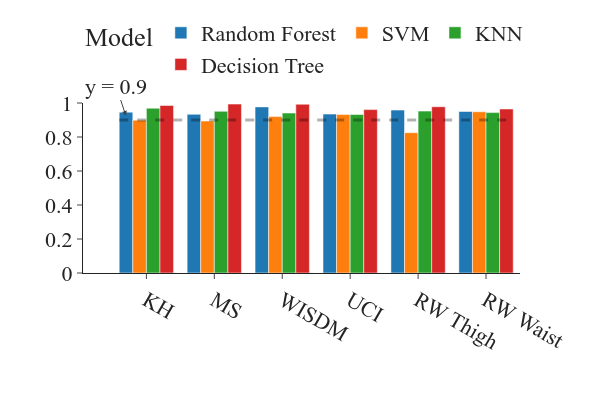

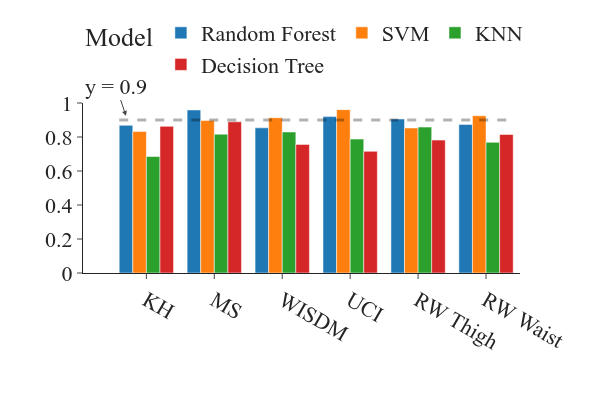

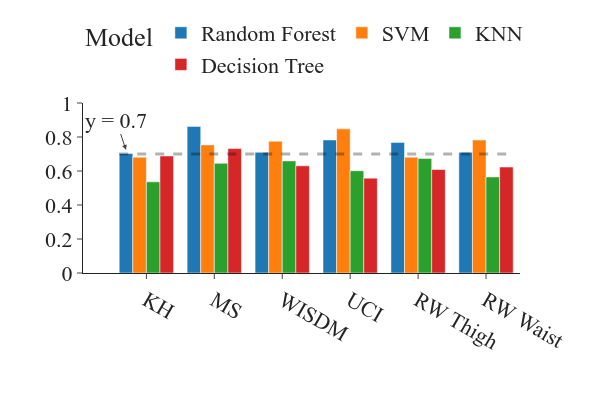

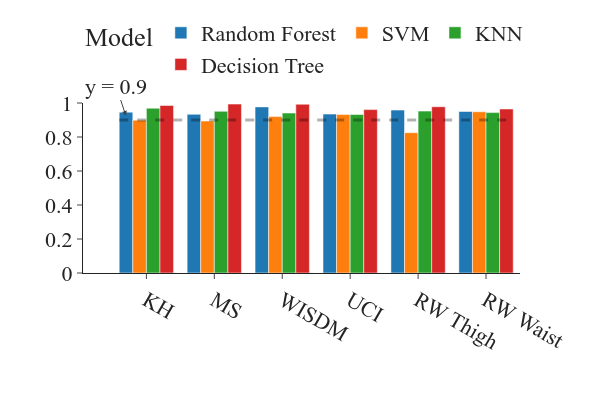

In [11]:

classifiers = ["Random Forest", "SVM", "KNN", "Decision Tree"]

features = [f"f-{i}" for i in range(24)]

df_lime = df_lime_per_feature.copy()
df_lime["XAI"] = "LIME"
df_lime = normilize_l1(df_lime, features)

df_shap = df_shap_values_per_feature.copy()
df_shap["XAI"] = "SHAP"
df_shap = normilize_l1(df_shap, features)

df_rf = df_features_rf.copy()
df_rf["XAI"] = "Random Forest"
df_rf = normilize_l1(df_rf, features)

df_oracle = df_features_oracle.copy()
df_oracle["XAI"] = "Oracle"
df_oracle = normilize_l1(df_oracle, features)

df_dt = df_features_dt.copy()
df_dt["XAI"] = "Decision Tree"
df_dt = normilize_l1(df_dt, features)

reduce_lst = []
ds_lst = []
classifier_lst = []
pearson_lst = []
spearman_lst = []
kendalltau_lst = []
linreg_lst = []

for classifier, dataset, reduce in product(classifiers, datasets_renamed, reduce_on):

    lime_fi_list = extract_fi_values(df_lime, classifier, dataset, dataset, reduce)
    shap_fi_list = extract_fi_values(df_shap, classifier, dataset, dataset, reduce)

    reduce_lst.append(reduce)
    ds_lst.append(dataset)
    classifier_lst.append(classifier)

    pearson_lst.append(scipy.stats.pearsonr(lime_fi_list, shap_fi_list)[0])
    spearman_lst.append(
        scipy.stats.spearmanr(lime_fi_list, shap_fi_list).correlation
    )
    kendalltau_lst.append(
        scipy.stats.kendalltau(
            lime_fi_list, shap_fi_list, variant="b"
        ).correlation
    )
    linreg_lst.append(scipy.stats.linregress(lime_fi_list, shap_fi_list).rvalue)

    show_x_vs_y(
        lime_fi_list,
        "Lime feature importance",
        shap_fi_list,
        "Shap feature importance",
        f"Lime vs Shap feature importance ({classifier} - {dataset} - {reduce})",
        show=False,
    )

correlation_table = pd.DataFrame(
    {
        "Reduce": reduce_lst,
        "Dataset": ds_lst,
        "Classifier": classifier_lst,
        "Pearson Corr": pearson_lst,
        "Spearman Corr": spearman_lst,
        "Kendalltau Corr": kendalltau_lst,
        "Lin. Reg. R Value": linreg_lst,
    }
)

for corr_type in [
    "Pearson Corr",
    "Spearman Corr",
    "Kendalltau Corr",
    "Lin. Reg. R Value",
]:
    file_name = f"feature_importance_values_correlation_{corr_type}.pdf"
    # title = f"{corr_type} (LIME and SHAP)"
    title = ''
    plot_correlation_per_classifier_bar(correlation_table, y=corr_type, file_name=file_name, title=title, legend_title="Model", transparency=False, save_results=False)

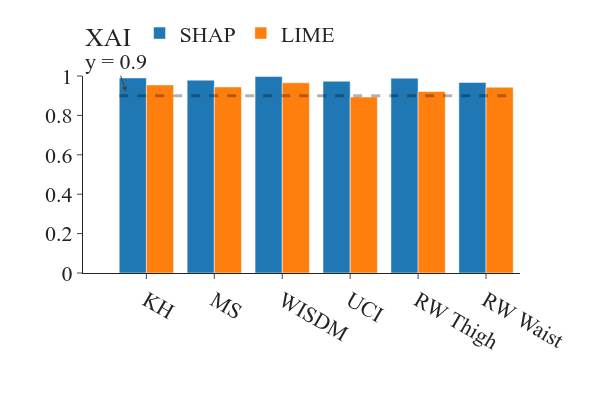

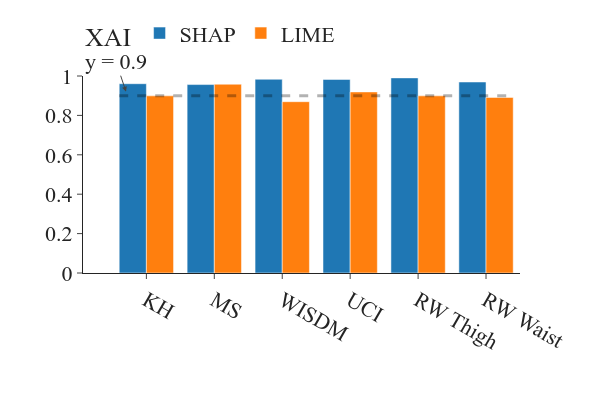

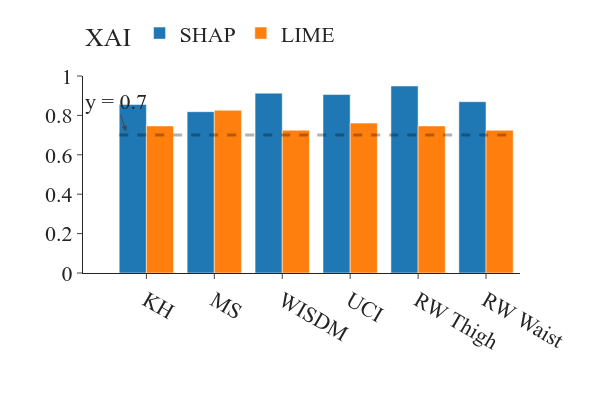

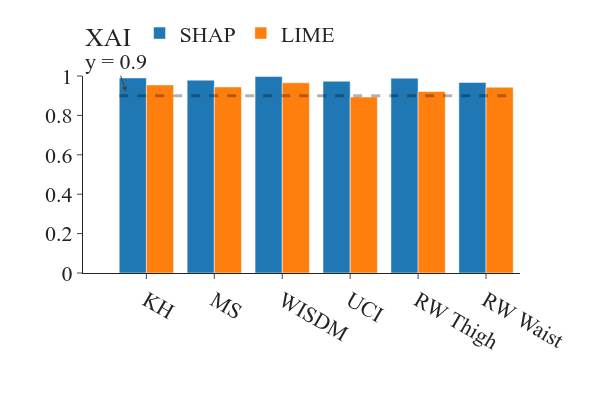

In [12]:
df_lime = df_lime_per_feature.copy()
df_lime["XAI"] = "LIME"
df_lime = normilize_l1(df_lime, features)

df_shap = df_shap_values_per_feature.copy()
df_shap["XAI"] = "SHAP"
df_shap = normilize_l1(df_shap, features)

df_rf = df_features_rf.copy()
df_rf["XAI"] = "Random Forest"
df_rf = normilize_l1(df_rf, features)

df_oracle = df_features_oracle.copy()
df_oracle["XAI"] = "Oracle"
df_oracle = normilize_l1(df_oracle, features)

df_dt = df_features_dt.copy()
df_dt["XAI"] = "Decision Tree"
df_dt = normilize_l1(df_dt, features)

reduce_lst = []
ds_lst = []
classifier_lst = []
pearson_lst = []
spearman_lst = []
kendalltau_lst = []
linreg_lst = []
xai_lst = []

for classifier, dataset, reduce in product(["Random Forest"], datasets_renamed, reduce_on):

    rf_fi_list = extract_fi_values(df_rf, classifier, dataset, dataset, reduce)

    for xai in ["SHAP", "LIME"]:
        df = df_shap if xai == "SHAP" else df_lime
        fi_list = extract_fi_values(df, classifier, dataset, dataset, reduce)

        reduce_lst.append(reduce)
        ds_lst.append(dataset)
        classifier_lst.append(classifier)
        xai_lst.append(xai)

        pearson_lst.append(scipy.stats.pearsonr(rf_fi_list, fi_list)[0])
        spearman_lst.append(
            scipy.stats.spearmanr(rf_fi_list, fi_list).correlation
        )
        kendalltau_lst.append(
            scipy.stats.kendalltau(rf_fi_list, fi_list, variant="b").correlation
        )
        linreg_lst.append(scipy.stats.linregress(rf_fi_list, fi_list).rvalue)

        show_x_vs_y(
            rf_fi_list,
            "Random Forest feature importance",
            fi_list,
            f"{xai} feature importance",
            f"Random Forest vs {xai} feature importance ({classifier} - {dataset} - {reduce})",
            show=False,
        )


correlation_table = pd.DataFrame(
    {
        "Reduce": reduce_lst,
        "Dataset": ds_lst,
        "Classifier": classifier_lst,
        "Pearson Corr": pearson_lst,
        "Spearman Corr": spearman_lst,
        "Kendalltau Corr": kendalltau_lst,
        "Lin. Reg. R Value": linreg_lst,
        "XAI": xai_lst,
    }
)

for corr_type in [
    "Pearson Corr",
    "Spearman Corr",
    "Kendalltau Corr",
    "Lin. Reg. R Value",
]:
    file_name = f"feature_importance_values_RF_vs_Lime_Shap_correlation_{corr_type}.pdf"
    title = ''
    plot_correlation_per_classifier_bar(correlation_table, y=corr_type, file_name=file_name, title=title, legend_title="XAI", color="XAI", transparency=False, save_results=False)

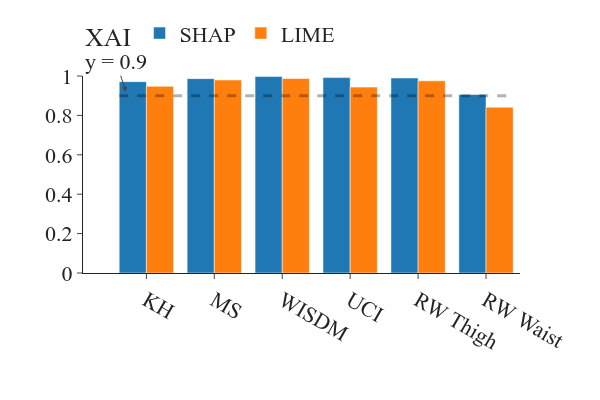

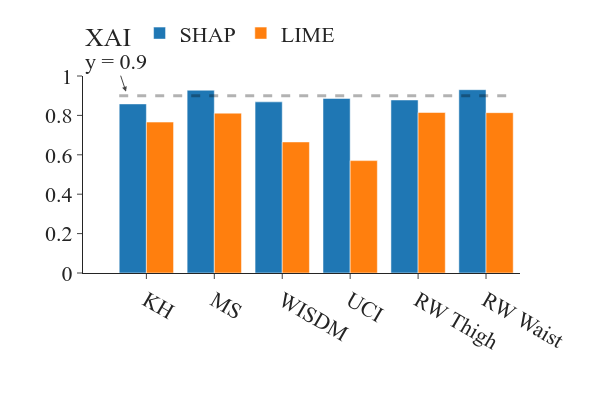

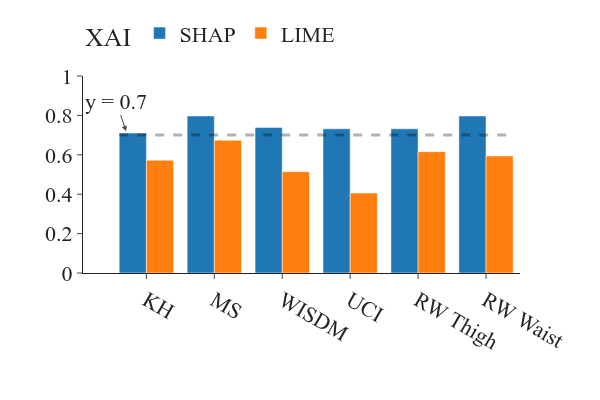

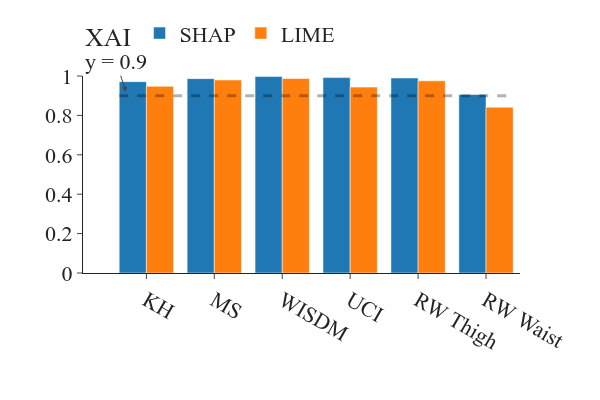

In [13]:
df_lime = df_lime_per_feature.copy()
df_lime["XAI"] = "LIME"
df_lime = normilize_l1(df_lime, features)

df_shap = df_shap_values_per_feature.copy()
df_shap["XAI"] = "SHAP"
df_shap = normilize_l1(df_shap, features)

df_rf = df_features_rf.copy()
df_rf["XAI"] = "Random Forest"
df_rf = normilize_l1(df_rf, features)

df_oracle = df_features_oracle.copy()
df_oracle["XAI"] = "Oracle"
df_oracle = normilize_l1(df_oracle, features)

df_dt = df_features_dt.copy()
df_dt["XAI"] = "Decision Tree"
df_dt = normilize_l1(df_dt, features)

reduce_lst = []
ds_lst = []
classifier_lst = []
pearson_lst = []
spearman_lst = []
kendalltau_lst = []
linreg_lst = []
xai_lst = []

for classifier, dataset, reduce in product(["Decision Tree"], datasets_renamed, reduce_on):

            dt_fi_list = extract_fi_values(df_dt, classifier, dataset, dataset, reduce)

            for xai in ["SHAP", "LIME"]:
                df = df_shap if xai == "SHAP" else df_lime
                fi_list = extract_fi_values(df, classifier, dataset, dataset, reduce)

                reduce_lst.append(reduce)
                ds_lst.append(dataset)
                classifier_lst.append(classifier)
                xai_lst.append(xai)

                pearson_lst.append(scipy.stats.pearsonr(dt_fi_list, fi_list)[0])
                spearman_lst.append(
                    scipy.stats.spearmanr(dt_fi_list, fi_list).correlation
                )
                kendalltau_lst.append(
                    scipy.stats.kendalltau(dt_fi_list, fi_list, variant="b").correlation
                )
                linreg_lst.append(scipy.stats.linregress(dt_fi_list, fi_list).rvalue)

                show_x_vs_y(
                    dt_fi_list,
                    "Decision Tree feature importance",
                    fi_list,
                    f"{xai} feature importance",
                    f"Decision Tree vs {xai} feature importance ({classifier} - {dataset} - {reduce})",
                    show=False,
                )


correlation_table = pd.DataFrame(
    {
        "Reduce": reduce_lst,
        "Dataset": ds_lst,
        "Classifier": classifier_lst,
        "Pearson Corr": pearson_lst,
        "Spearman Corr": spearman_lst,
        "Kendalltau Corr": kendalltau_lst,
        "Lin. Reg. R Value": linreg_lst,
        "XAI": xai_lst,
    }
)

for corr_type in [
    "Pearson Corr",
    "Spearman Corr",
    "Kendalltau Corr",
    "Lin. Reg. R Value",
]:

    file_name = f"feature_importance_values_DT_vs_Lime_Shap_correlation_{corr_type}.pdf"
    title = ''
    plot_correlation_per_classifier_bar(correlation_table, y=corr_type, file_name=file_name, title=title, legend_title="XAI", color="XAI", transparency=False, save_results=False)

### ML Pair analysis

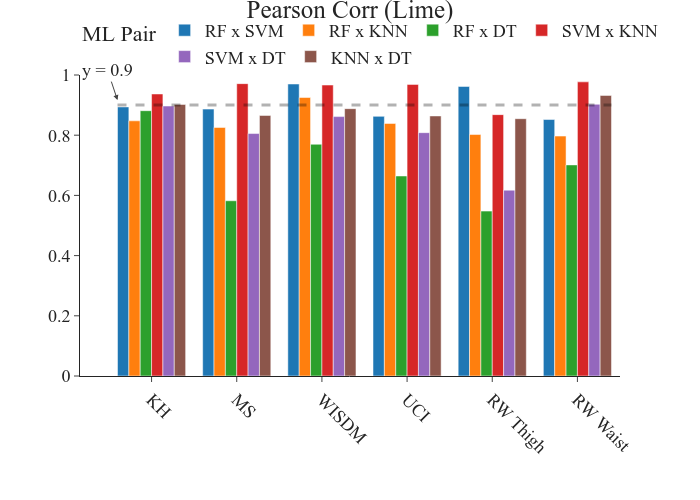

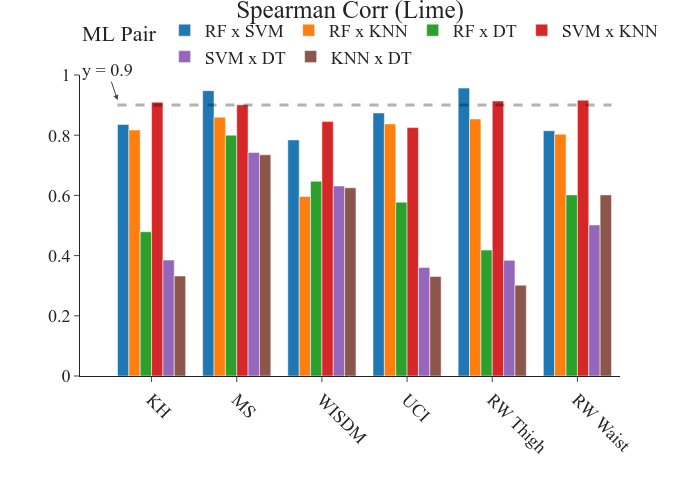

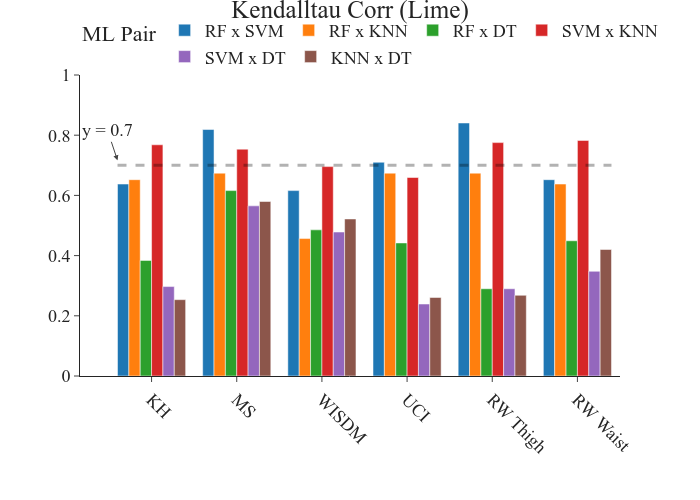

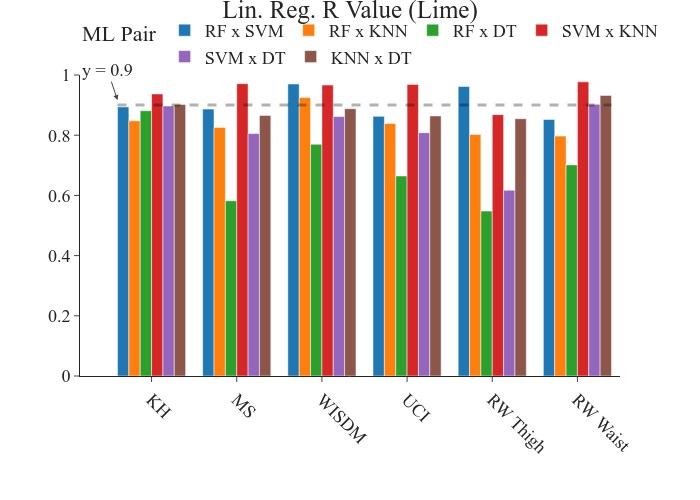

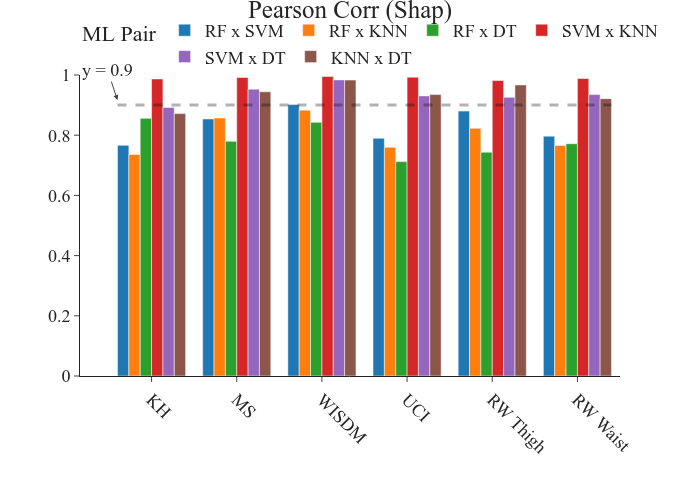

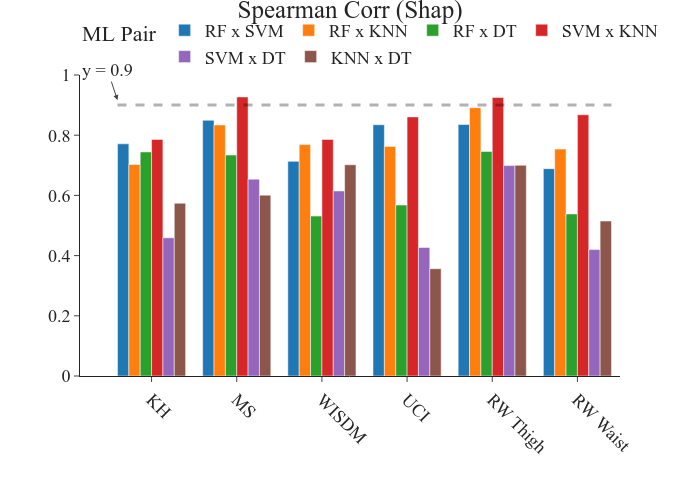

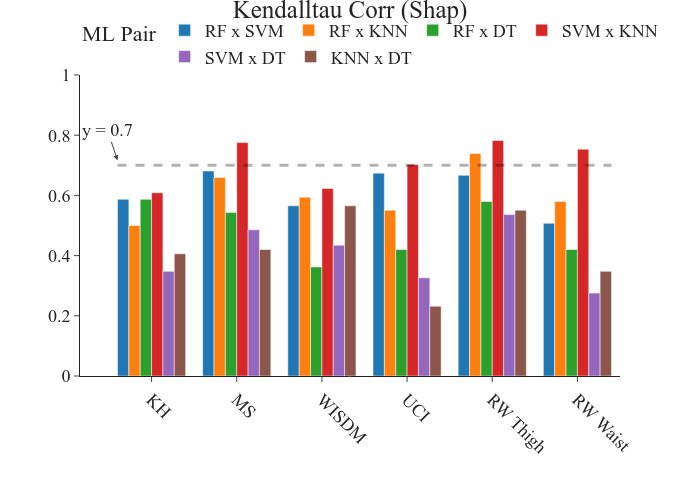

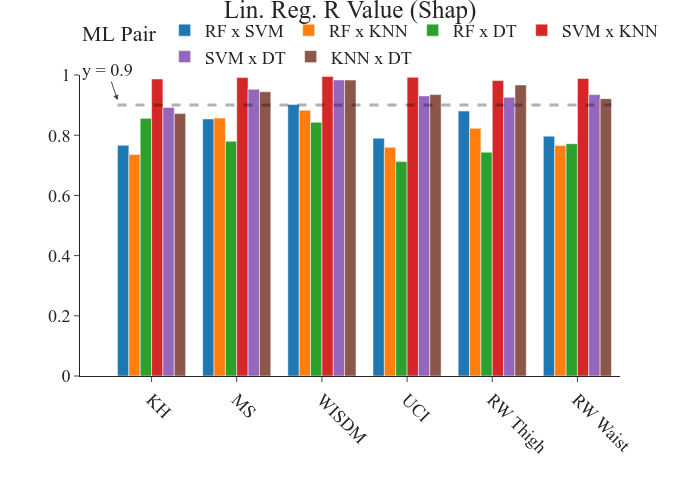

In [14]:
classifiers = ["Random Forest", "SVM", "KNN", "Decision Tree"]
features = [f"f-{i}" for i in range(24)]

df_lime = df_lime_per_feature.copy()
df_lime["XAI"] = "LIME"
df_lime = normilize_l1(df_lime, features)

df_shap = df_shap_values_per_feature.copy()
df_shap["XAI"] = "SHAP"
df_shap = normilize_l1(df_shap, features)

df_rf = df_features_rf.copy()
df_rf["XAI"] = "Random Forest"
df_rf = normilize_l1(df_rf, features)

df_oracle = df_features_oracle.copy()
df_oracle["XAI"] = "Oracle"
df_oracle = normilize_l1(df_oracle, features)

reduce_lst = []
ds_lst = []
xai_lst = []
pair_lst = []
pearson_lst = []
spearman_lst = []
kendalltau_lst = []
linreg_lst = []

lst_df_xai = [(df_lime, "Lime"), (df_shap, "Shap"), (df_oracle, "Oracle")]
# for reduce in ["all"]:  # reduce_on:# [:1]: # reduce_on:
#     for dataset in datasets:  # [:1]: # datasets:
        # for df, xai_str in [
        #     (df_shap, "Shap"),
        #     (df_lime, "Lime"),
        #     (df_oracle, "Oracle"),
        # ]:

for reduce, dataset, (df, xai_str) in product(reduce_on, datasets_renamed, lst_df_xai):

    fi_RF_list = extract_fi_values(df, "Random Forest", dataset, dataset, reduce)
    fi_SVM_list = extract_fi_values(df, "SVM", dataset, dataset, reduce)
    fi_KNN_list = extract_fi_values(df, "KNN", dataset, dataset, reduce)
    fi_DT_list = extract_fi_values(df, "Decision Tree", dataset, dataset, reduce)

    # classifiers = ["Random Forest", "SVM", "KNN", "Decision Tree"]
    for clf1, clf2 in combinations(classifiers, 2):
        clf1_name = (
            "RF"
            if clf1 == "Random Forest"
            else "DT"
            if clf1 == "Decision Tree"
            else clf1
        )
        clf2_name = (
            "RF"
            if clf2 == "Random Forest"
            else "DT"
            if clf2 == "Decision Tree"
            else clf2
        )

        reduce_lst.append(reduce)
        ds_lst.append(dataset)
        xai_lst.append(xai_str)
        pair_lst.append(f"{clf1_name} x {clf2_name}")
        fi_clf1_list = extract_fi_values(df, clf1, dataset, dataset, reduce)
        fi_clf2_list = extract_fi_values(df, clf2, dataset, dataset, reduce)

        pearson_lst.append(scipy.stats.pearsonr(fi_clf1_list, fi_clf2_list)[0])
        spearman_lst.append(
            scipy.stats.spearmanr(fi_clf1_list, fi_clf2_list).correlation
        )
        kendalltau_lst.append(
            scipy.stats.kendalltau(fi_clf1_list, fi_clf2_list).correlation
        )
        linreg_lst.append(
            scipy.stats.linregress(fi_clf1_list, fi_clf2_list).rvalue
        )


correlation_table = pd.DataFrame(
    {
        "Reduce": reduce_lst,
        "Dataset": ds_lst,
        "xAI": xai_lst,
        "ML Pair": pair_lst,
        "Pearson Corr": pearson_lst,
        "Spearman Corr": spearman_lst,
        "Kendalltau Corr": kendalltau_lst,
        "Lin. Reg. R Value": linreg_lst,
    }
)


if True:
    for xai_str in ["Lime", "Shap"]:#["Lime", "Shap", "Oracle"]:
        for corr_type in [
            "Pearson Corr",
            "Spearman Corr",
            "Kendalltau Corr",
            "Lin. Reg. R Value",
        ]:
            # plot_correlation_per_ML_pair_bar(
            #     correlation_table[(correlation_table["xAI"] == xai_str)],
            #     corr_type,
            #     xai_str,
            # )
              
            plot_correlation_per_ML_pair_bar(
                correlation_table[(correlation_table["xAI"] == xai_str)],
                corr_type,
                xai_str,
                # title=f"{corr_type} between ML pairs FI ({xai_str})",
                # title="",
                title=f'{corr_type} ({xai_str})',
                file_name=f"feature_importance_values_{xai_str}_ML_pairs_correlation_{corr_type}.pdf",
                legend_title="ML Pair",
                color="ML Pair",
                save_results=False
            )

# correlation_table.describe()

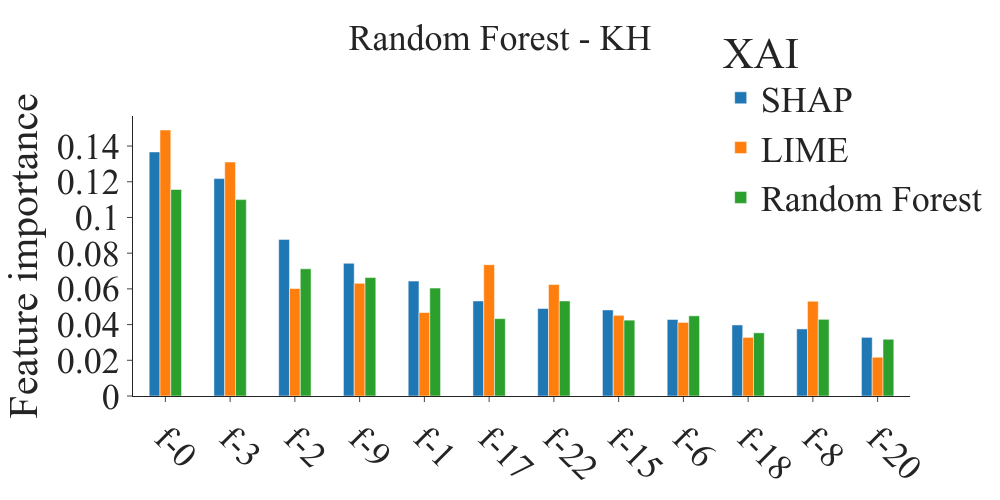

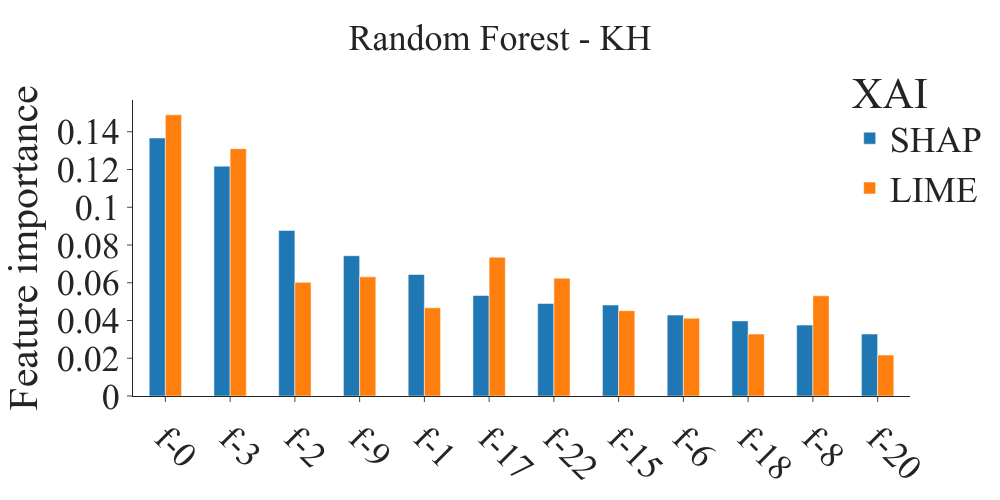

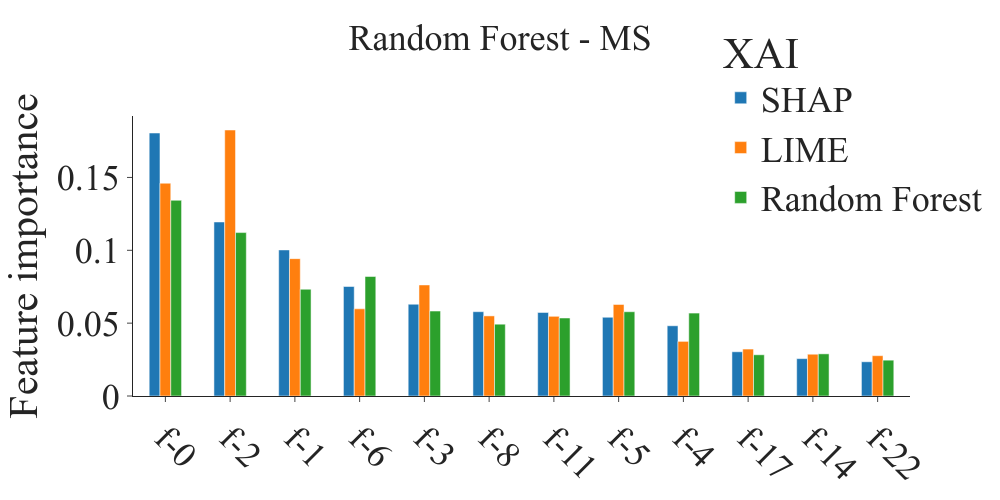

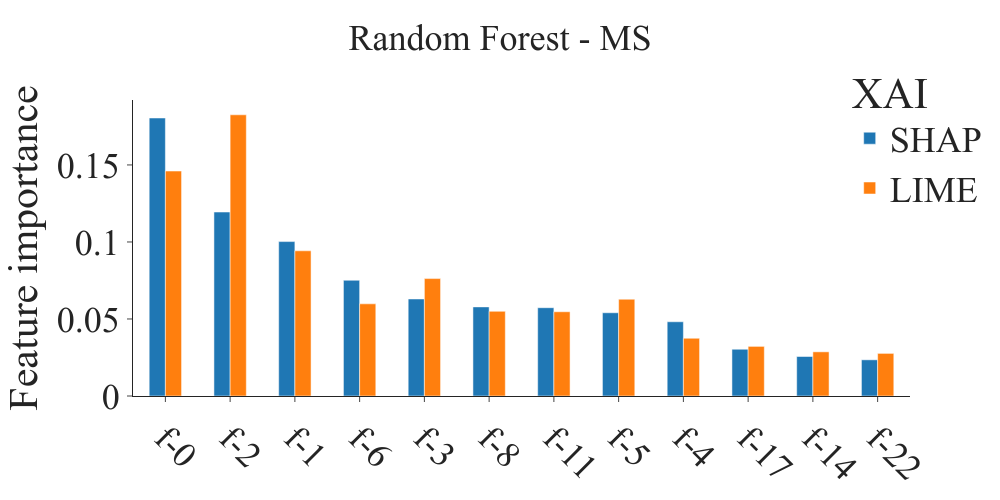

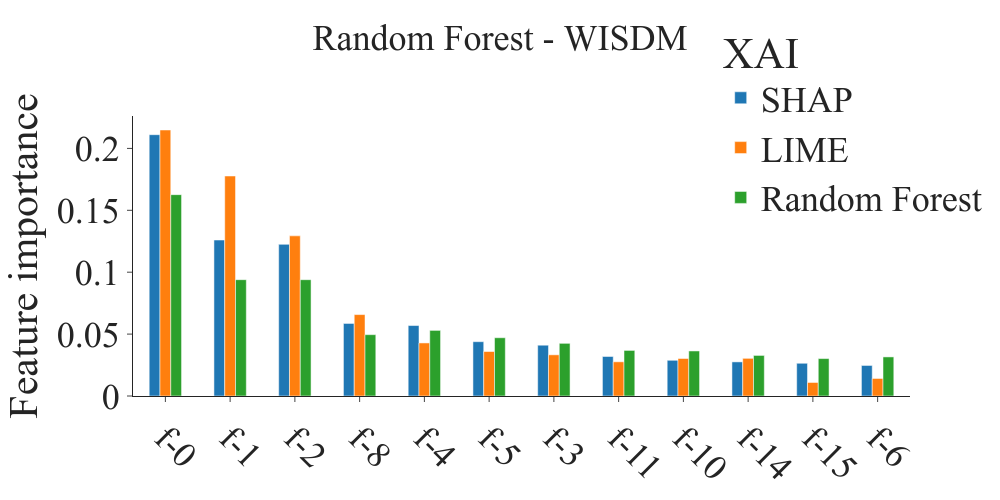

...

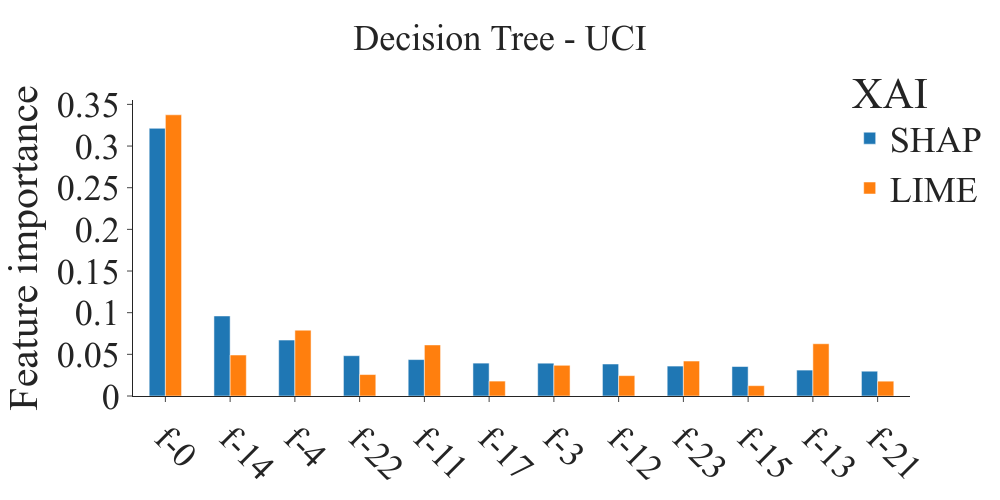

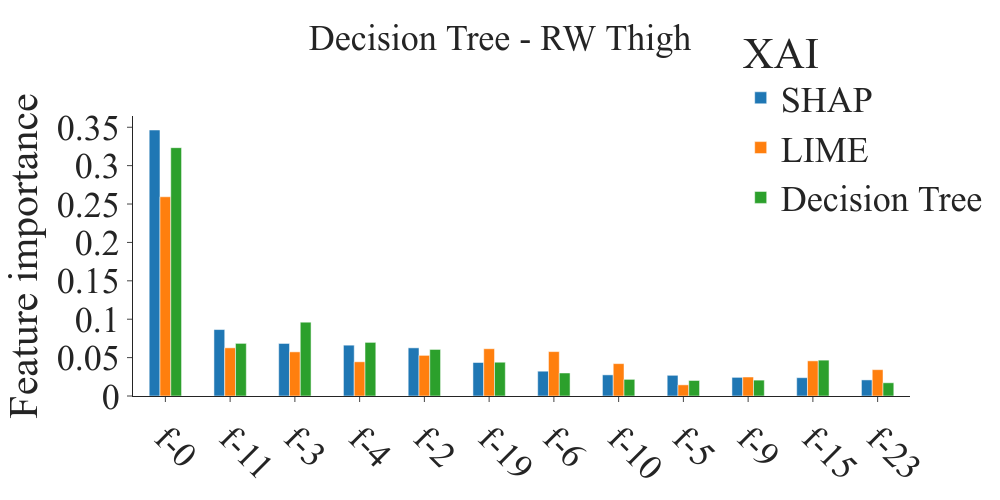

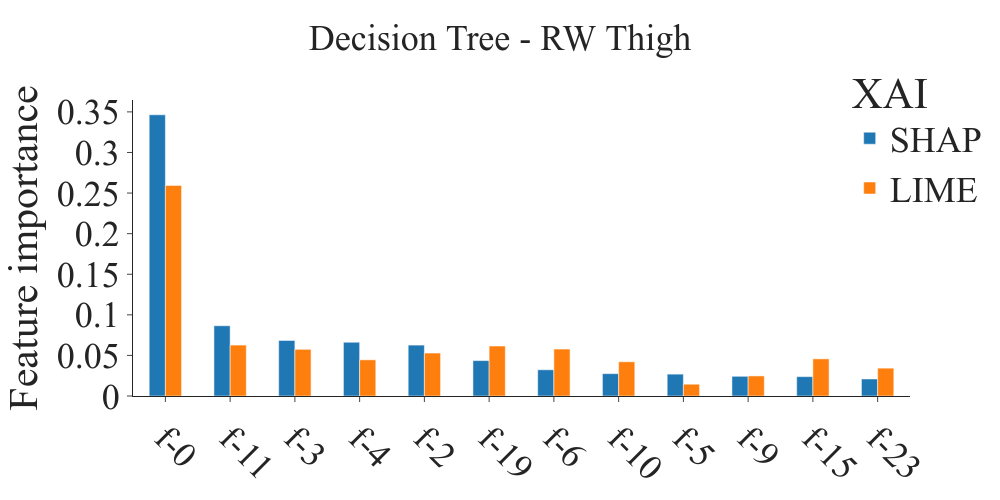

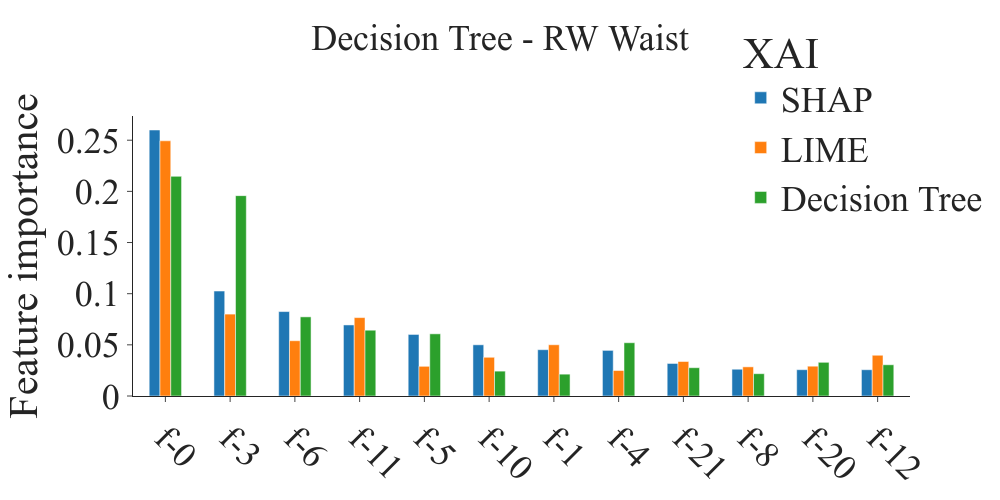

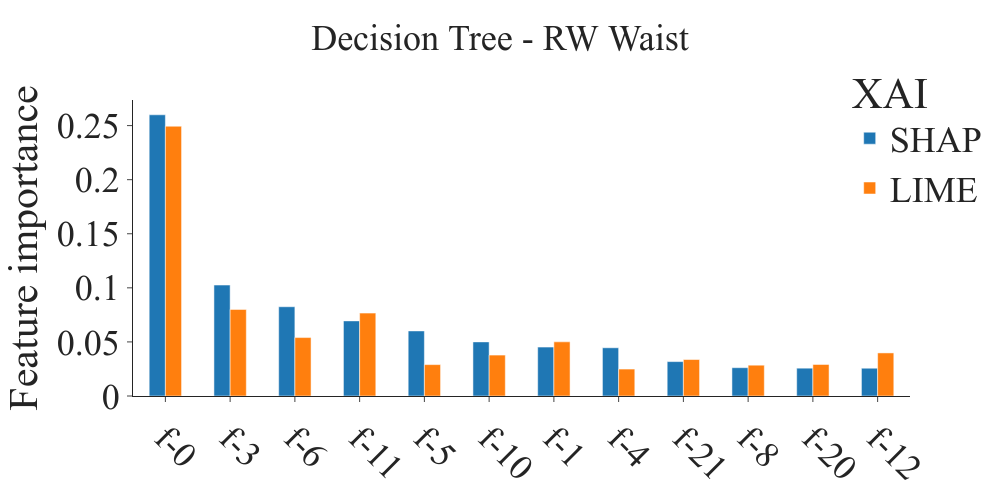

In [15]:
# Let's read the feature importance values by RandomForest

classifiers = ["Random Forest", "SVM", "KNN", "Decision Tree"]
features = [f"f-{i}" for i in range(24)]

# reduce_on = ["axis", "sensor", "all"]

df_lime = df_lime_per_feature.copy()
df_lime["XAI"] = "LIME"
df_lime = normilize_l1(df_lime, features)

df_shap = df_shap_values_per_feature.copy()
df_shap["XAI"] = "SHAP"
df_shap = normilize_l1(df_shap, features)

df_rf = df_features_rf.copy()
df_rf["XAI"] = "Random Forest"
df_rf = normilize_l1(df_rf, features)

df_dt = df_features_dt.copy()
df_dt["XAI"] = "Decision Tree"
df_dt = normilize_l1(df_dt, features)

df_oracle = df_features_oracle.copy()
df_oracle["XAI"] = "Oracle"
df_oracle = normilize_l1(df_oracle, features)

df_trees = df_features_trees_rf.copy()
df_trees["XAI"] = "Random Forest - Trees"
df_trees["Classifier"] = "Random Forest"
df_trees.drop(["Tree id"], axis=1, inplace=True)

# Normilize the values of trees
dfs = []
for (dataset, reduce), sub_df in df_trees.groupby(["Train", "reduce on"]):
    means = {i: 0 for i in range(num_features)}
    for i in range(24):
        means[i] = df_trees[
            (df_trees["Train"] == dataset)
            & (df_trees["Test"] == dataset)
            & (df_trees["reduce on"] == reduce)
            & (df_trees["Classifier"] == "Random Forest")
        ][f"f-{i}"].mean()
    norm = np.sum(list(means.values()))
    new_df = sub_df.copy()
    for feature in features:
        new_df[feature] = new_df[feature] / norm
    # for i in range(24):
    #     new_df[f"f {i}"] = new_df[f"f {i}"] / norm

    dfs.append(new_df)

df_trees = pd.concat(dfs)

# for reduce in reduce_on:
#     for dataset in datasets:
#         for classifier in classifiers:
for classifier, dataset, reduce, include_Tree_FI in product(classifiers, datasets_renamed, reduce_on, [True, False]):

    title=f"{classifier} - {dataset}"
    # title=""
    plot_feature_importance_values_bar_horizontal(df_lime, df_shap, df_rf, df_oracle, df_trees, df_dt, features, classifier, dataset, dataset, reduce, title, transparency=False, save_results=False, include_Tree_FI=include_Tree_FI,)

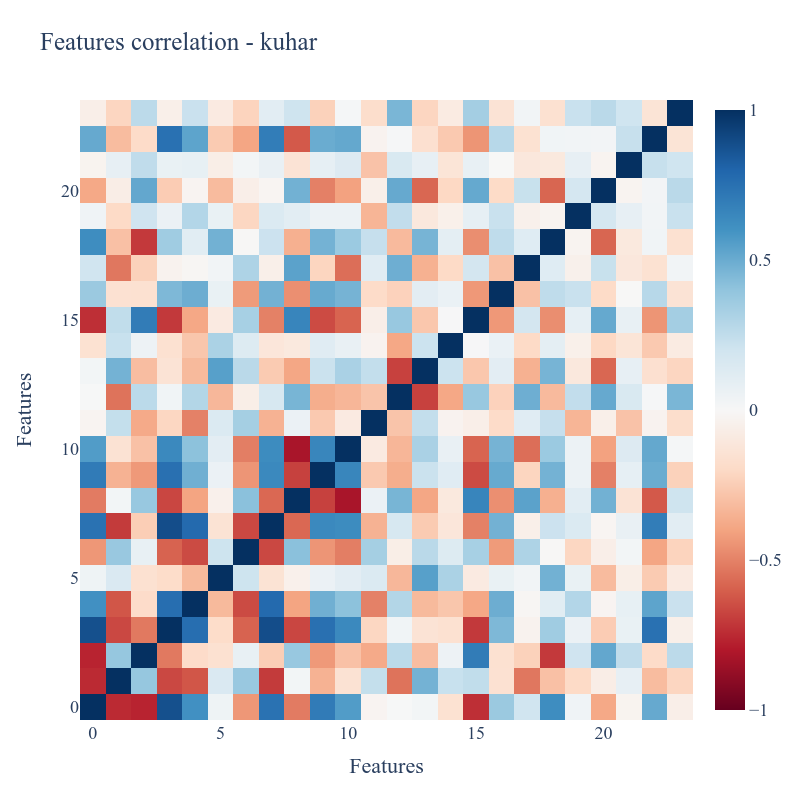

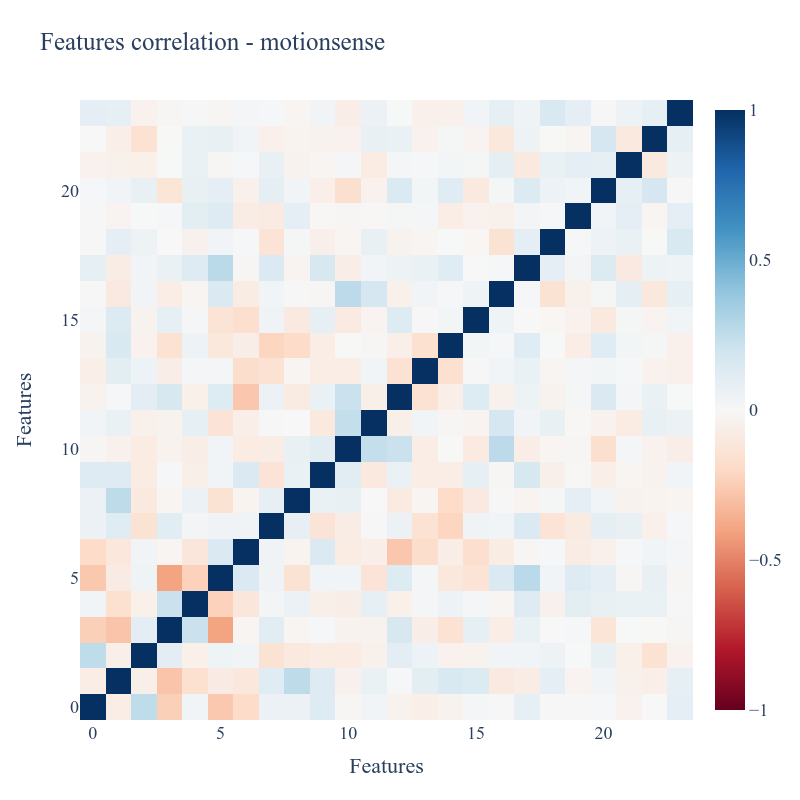

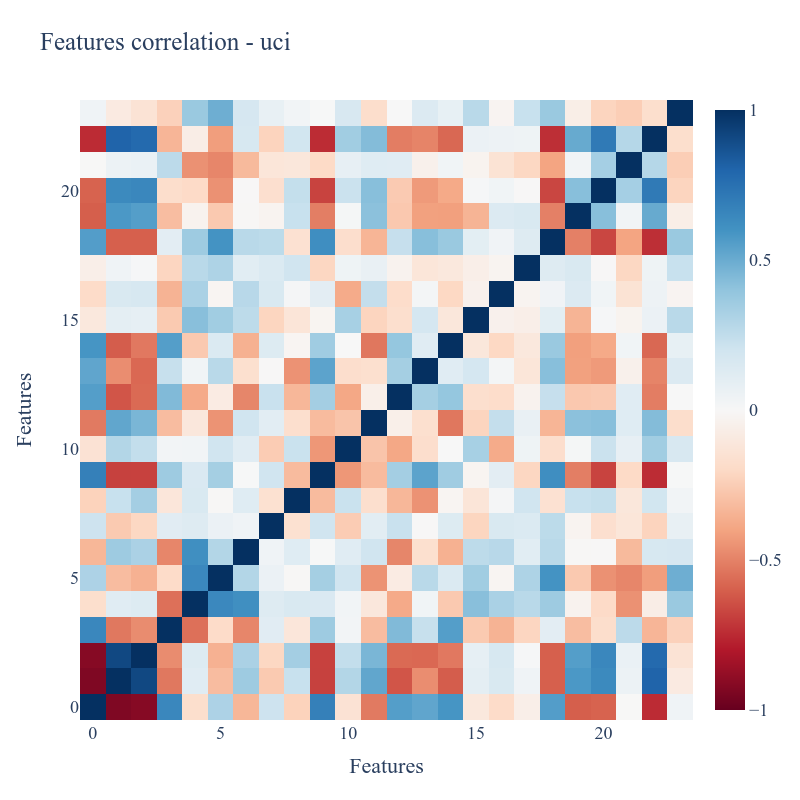

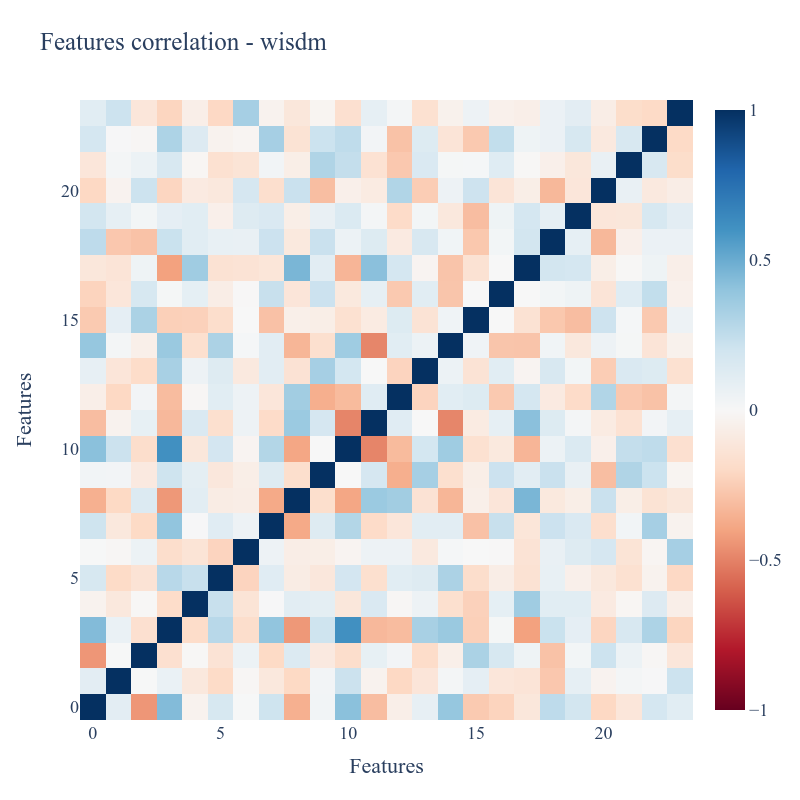

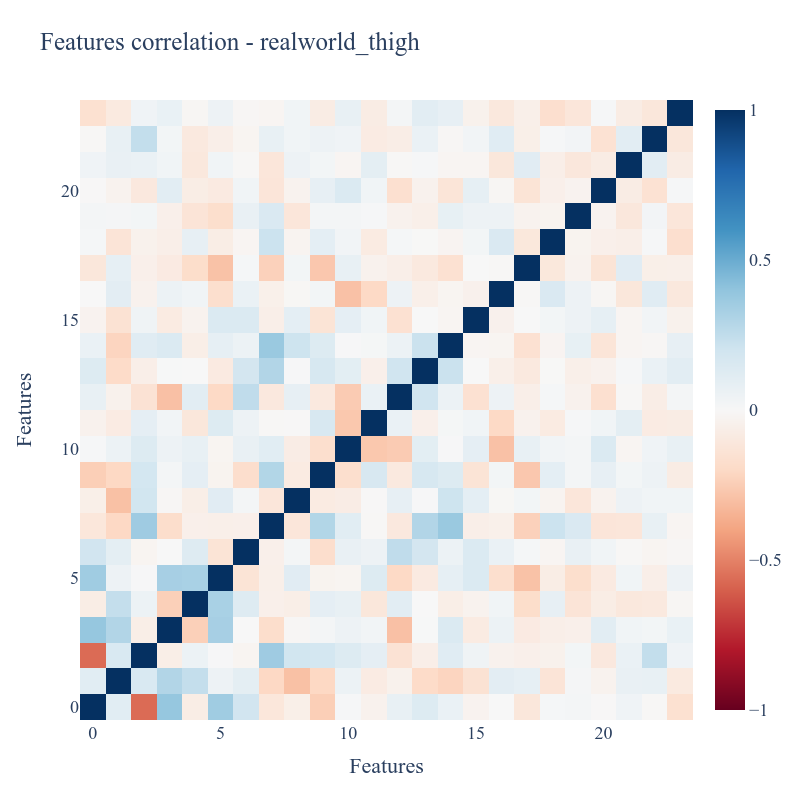

In [16]:
# Let's calculate the correlation between the features of the datasets

for dataset in ['kuhar', 'motionsense', 'uci', 'wisdm', 'realworld_thigh']:
    train, test = load_dataset(dataset, dataset, "all", path=data_path)
    correlation_table = []
    for i in range(24):
        corr = []
        for j in range(24):
            per = scipy.stats.pearsonr(train.X[:, i], train.X[:, j])[0]
            corr.append(per)
        corr = np.array(corr)
        correlation_table.append(corr)
    correlation_table = np.array(correlation_table)

    fig = go.Figure(data=go.Heatmap(z=correlation_table, colorscale="RdBu", zmin=-1, zmax=1))
    fig.update_layout(
        title=f"Features correlation - {dataset}",
        xaxis_title="Features",
        yaxis_title="Features",
        font=dict(family="Serif", size=18),
        width=800,
        height=800,
    )


    fig.show("png")

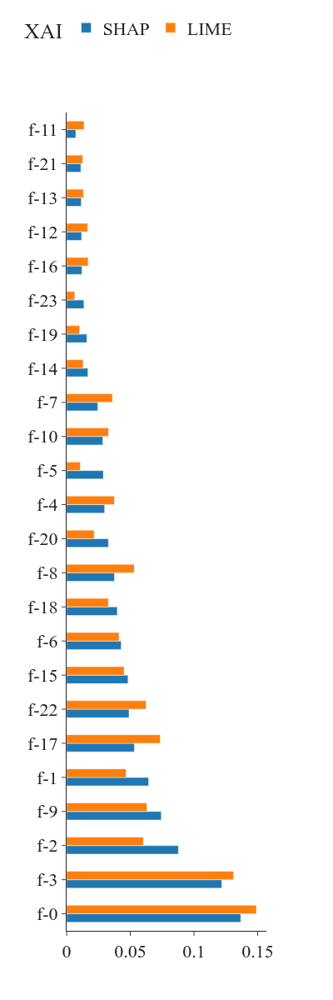

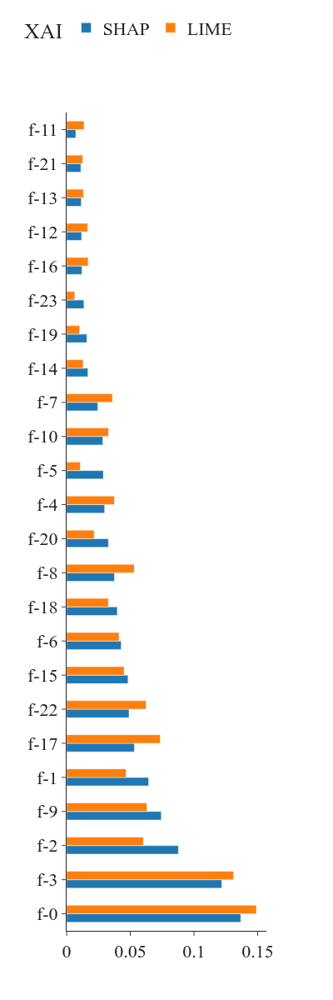

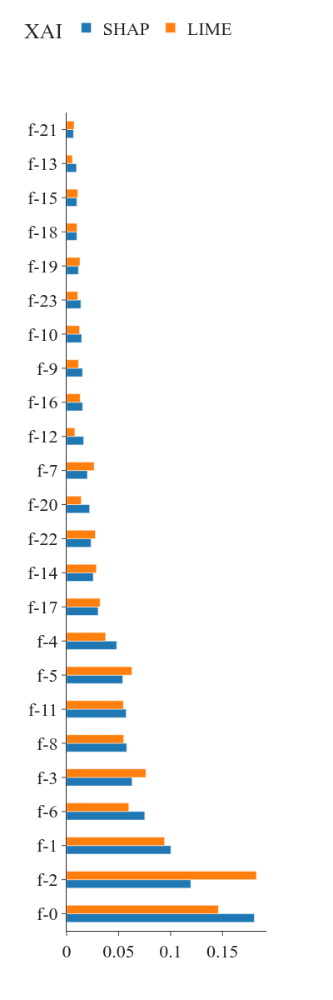

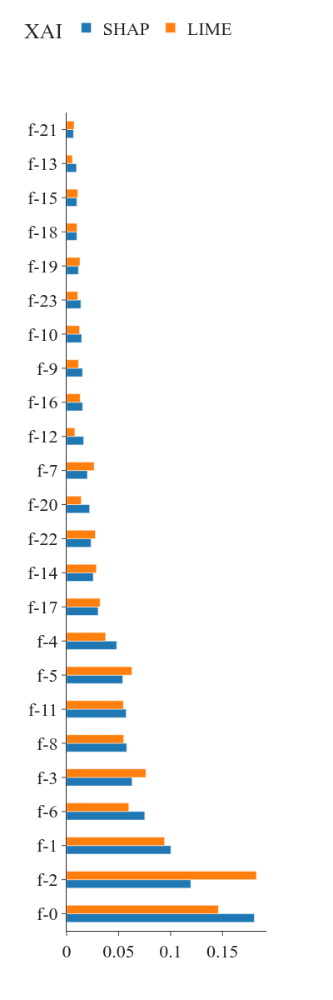

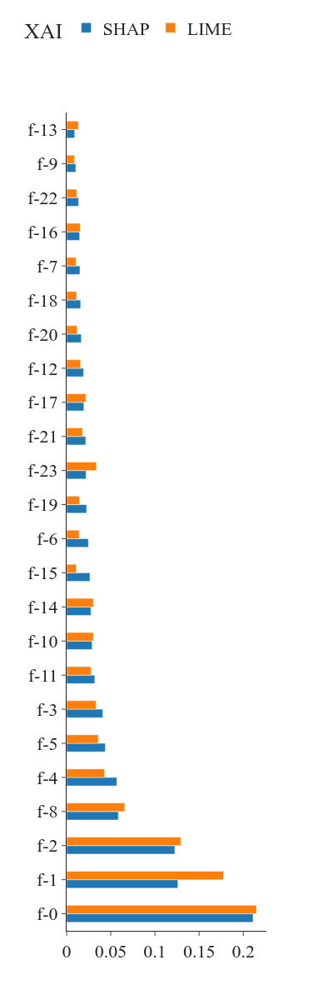

...

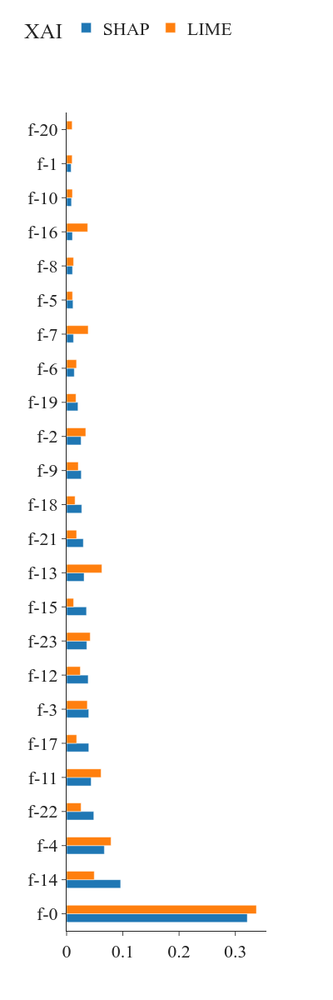

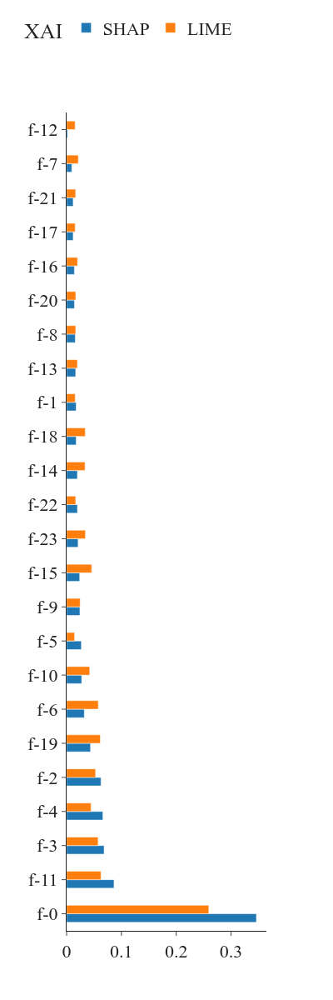

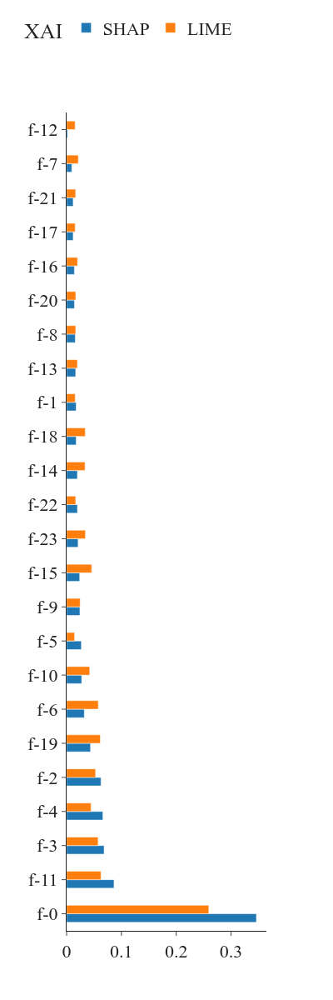

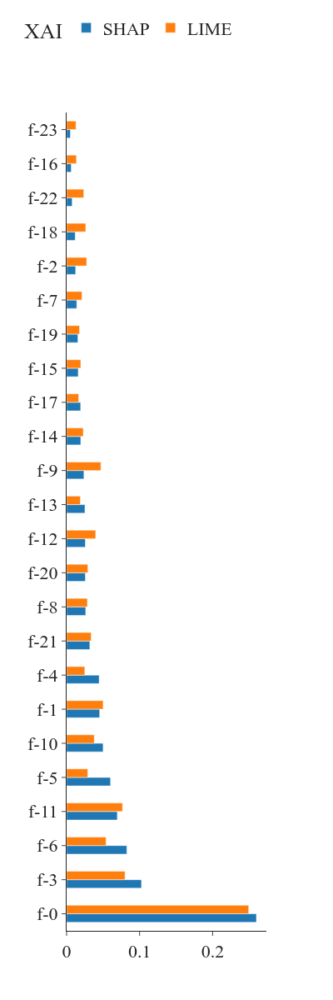

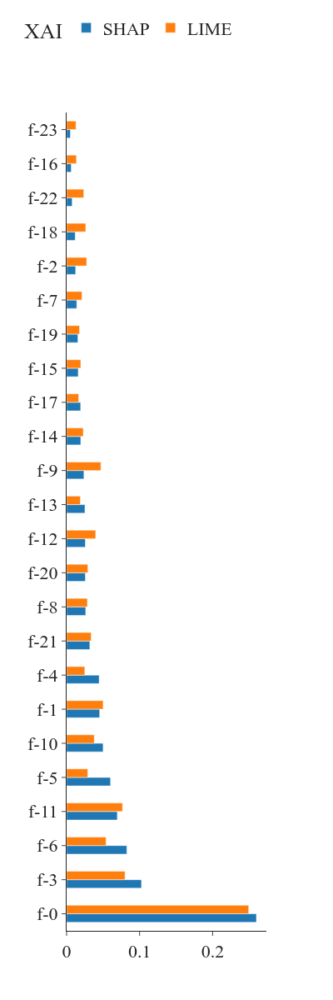

In [17]:
# Let's read the feature importance values by RandomForest

classifiers = ["Random Forest", "SVM", "KNN", "Decision Tree"]
features = [f"f-{i}" for i in range(24)]

# reduce_on = ["axis", "sensor", "all"]

df_lime = df_lime_per_feature.copy()
df_lime["XAI"] = "LIME"
df_lime = normilize_l1(df_lime, features)

df_shap = df_shap_values_per_feature.copy()
df_shap["XAI"] = "SHAP"
df_shap = normilize_l1(df_shap, features)

df_rf = df_features_rf.copy()
df_rf["XAI"] = "Random Forest"
df_rf = normilize_l1(df_rf, features)

df_dt = df_features_dt.copy()
df_dt["XAI"] = "Decision Tree"
df_dt = normilize_l1(df_dt, features)

df_oracle = df_features_oracle.copy()
df_oracle["XAI"] = "Oracle"
df_oracle = normilize_l1(df_oracle, features)

df_trees = df_features_trees_rf.copy()
df_trees["XAI"] = "Random Forest - Trees"
df_trees["Classifier"] = "Random Forest"
df_trees.drop(["Tree id"], axis=1, inplace=True)

# Normilize the values of trees
dfs = []
for (dataset, reduce), sub_df in df_trees.groupby(["Train", "reduce on"]):
    means = {i: 0 for i in range(24)}
    for i in range(24):
        means[i] = df_trees[
            (df_trees["Train"] == dataset)
            & (df_trees["Test"] == dataset)
            & (df_trees["reduce on"] == reduce)
            & (df_trees["Classifier"] == "Random Forest")
        ][f"f-{i}"].mean()
    norm = np.sum(list(means.values()))
    new_df = sub_df.copy()
    for i in range(24):
        new_df[f"f-{i}"] = new_df[f"f-{i}"] / norm

    dfs.append(new_df)

df_trees = pd.concat(dfs)

# for reduce in reduce_on:
#     for dataset in datasets:
#         for classifier in classifiers:
for classifier, dataset, reduce, include_Tree_FI in product(classifiers, datasets_renamed, reduce_on, [True, False]):

    # title=f"Feature importance values sorted by SHAP values - {classifier} - {dataset}"
    # title=f"Feature importance values - {classifier} - {dataset}"
    title=""
    plot_feature_importance_values_bar_vertical(df_lime, df_shap, df_rf, df_oracle, df_trees, df_dt, features, classifier, dataset, dataset, reduce, title, transparency=False, save_results=False, include_Tree_FI=False,)

[('KH', 'MS'), ('KH', 'WISDM'), ('KH', 'UCI'), ('KH', 'RW Thigh'), ('KH', 'RW Waist'), ('MS', 'WISDM'), ('MS', 'UCI'), ('MS', 'RW Thigh'), ('MS', 'RW Waist'), ('WISDM', 'UCI'), ('WISDM', 'RW Thigh'), ('WISDM', 'RW Waist'), ('UCI', 'RW Thigh'), ('UCI', 'RW Waist'), ('RW Thigh', 'RW Waist')]


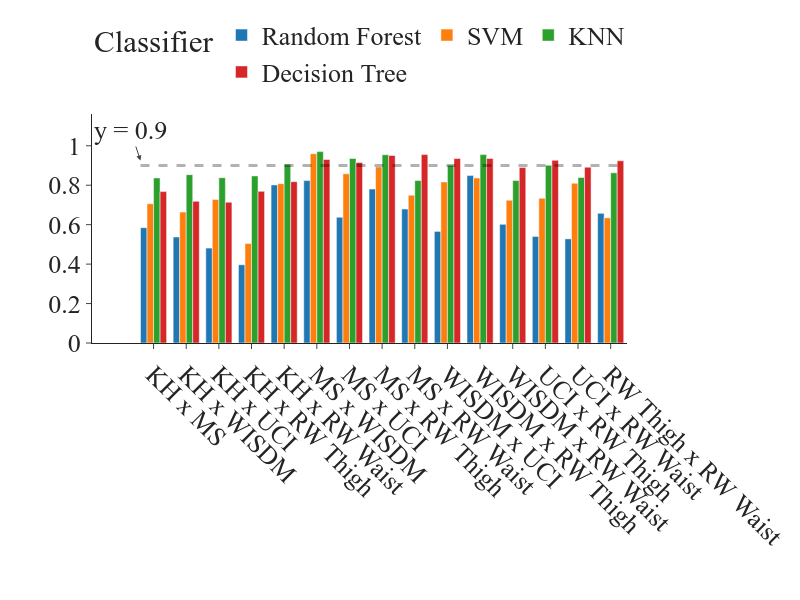

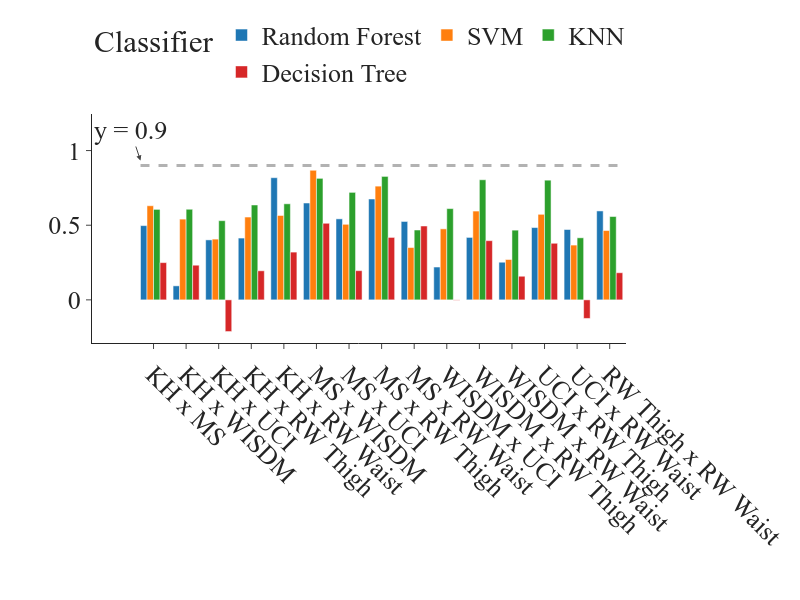

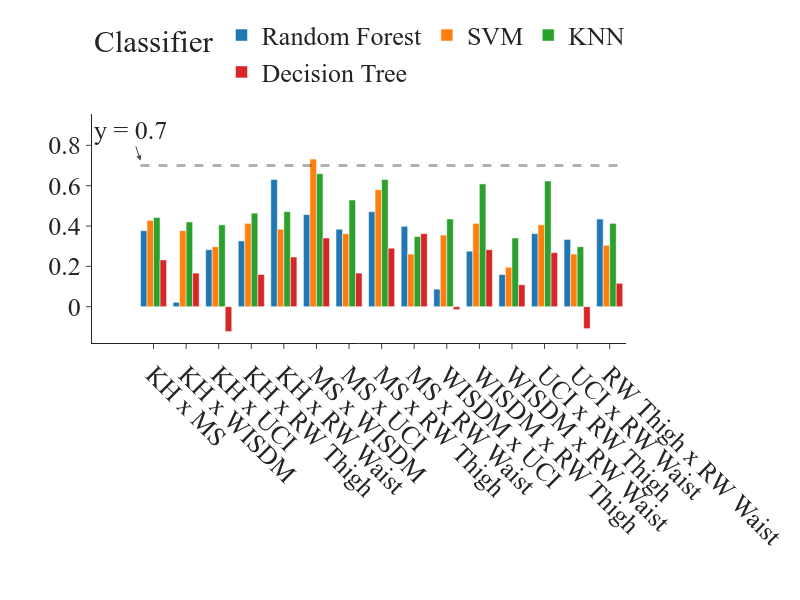

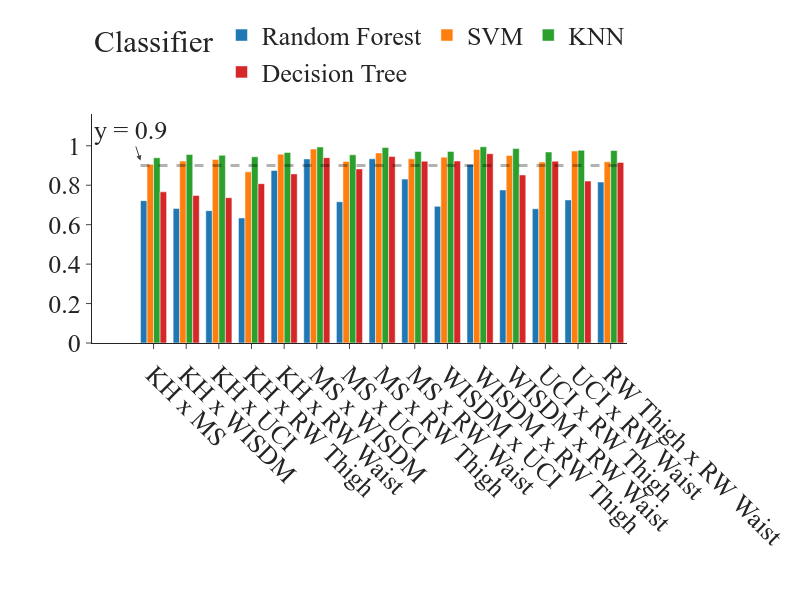

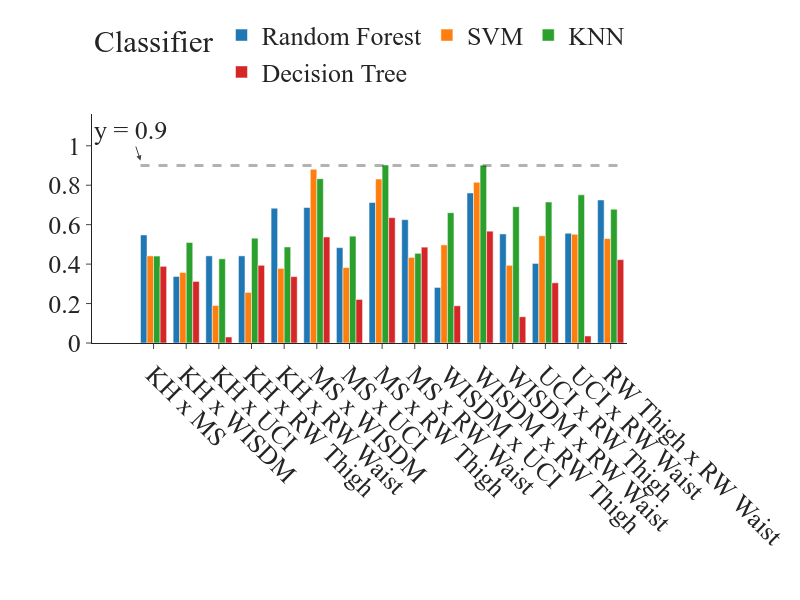

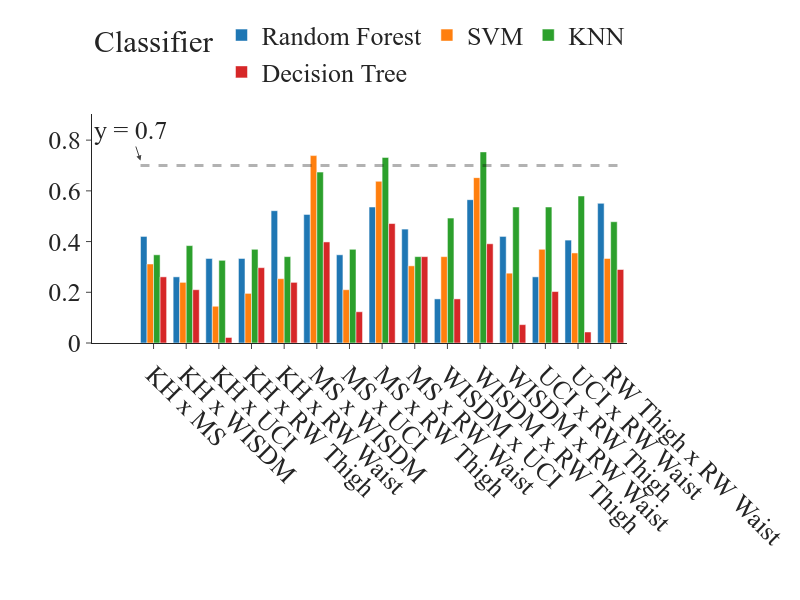

,Pearson Corr,Spearman Corr,Kendalltau Corr,Lin. Reg. R Value
count,180.000000,180.000000,180.000000,180.000000
mean,0.571883,0.336585,0.246445,0.571883
std,0.408830,0.296255,0.227729,0.408830
min,-0.405097,-0.428330,-0.346314,-0.405097
25%,0.158119,0.102330,0.070127,0.158119
50%,0.748809,0.393913,0.271739,0.748809
75%,0.920758,0.545347,0.400362,0.920758
max,0.994901,0.902609,0.753623,0.994901


In [18]:
classifiers = ["Random Forest", "SVM", "KNN", "Decision Tree"]
features = [f"f-{i}" for i in range(24)]

# reduce_on = ["axis", "sensor", "all"]

df_lime = df_lime_per_feature.copy()
df_lime["XAI"] = "LIME"
df_lime = normilize_l1(df_lime, features)

df_shap = df_shap_values_per_feature.copy()
df_shap["XAI"] = "SHAP"
df_shap = normilize_l1(df_shap, features)

df_rf = df_features_rf.copy()
df_rf["XAI"] = "Random Forest"
df_rf = normilize_l1(df_rf, features)

df_oracle = df_features_oracle.copy()
df_oracle["XAI"] = "Oracle"
df_oracle = normilize_l1(df_oracle, features)

reduce_lst = []
ds_lst = []
xai_lst = []
pair_lst = []
model_lst = []
pearson_lst = []
spearman_lst = []
kendalltau_lst = []
linreg_lst = []

ds_pair_list = []
for i in range(len(datasets_renamed)):
    for j in range(i + 1, len(datasets_renamed)):
        ds_pair_list.append((datasets_renamed[i], datasets_renamed[j]))
print(ds_pair_list)

for reduce, (df, xai_str), model in product(reduce_on, lst_df_xai, classifiers):
    for ds1, ds2 in ds_pair_list:  #  [("uci","kuhar")]:

        fi_ds1_list = extract_fi_values(df, model, ds1, ds1, reduce)
        fi_ds2_list = extract_fi_values(df, model, ds2, ds2, reduce)

        reduce_lst.append(reduce)
        ds_lst.append(ds1)
        xai_lst.append(xai_str)
        pair_lst.append(f"{ds1} x {ds2}")
        model_lst.append(model)
        pearson_lst.append(scipy.stats.pearsonr(fi_ds1_list, fi_ds2_list)[0])
        spearman_lst.append(
            scipy.stats.spearmanr(fi_ds1_list, fi_ds2_list).correlation
        )
        kendalltau_lst.append(
            scipy.stats.kendalltau(fi_ds1_list, fi_ds2_list).correlation
        )
        linreg_lst.append(
            scipy.stats.linregress(fi_ds1_list, fi_ds2_list).rvalue
        )


correlation_table = pd.DataFrame(
    {
        "Reduce": reduce_lst,
        "xAI": xai_lst,
        "Classifier": model_lst,
        "DS1": ds_lst,
        "DS Pair": pair_lst,
        "Pearson Corr": pearson_lst,
        "Spearman Corr": spearman_lst,
        "Kendalltau Corr": kendalltau_lst,
        "Lin. Reg. R Value": linreg_lst,
    }
)

if False:
    for model_str in ["Random Forest", "KNN", "SVM"]:
        for xai_str in ["Lime", "Shap"]:
            for corr_type in [
                "Pearson Corr",
                "Spearman Corr",
                "Kendalltau Corr",
                "Lin. Reg. R Value",
            ]:
                plot_correlation_per_DS_pair_bar(
                    correlation_table[
                        (correlation_table["xAI"] == xai_str)
                        & (correlation_table["Model"] == model_str)
                    ],
                    corr_type,
                    xai_str,
                    model_str,
                )

if True:
    # title=f"Feature importance values produced by {xai_str} for {model}",
    title=""
    for xai_str in ["Lime", "Shap"]:
        for corr_type in ["Pearson Corr", "Spearman Corr", "Kendalltau Corr"]:
            plot_correlation_per_DS_pair_bar(
                correlation_table[(correlation_table["xAI"] == xai_str)],
                corr_type,
                xai_str,
                title,
            )

correlation_table.describe()
# print(correlation_table.sort_values(by=["Pearson Corr"]))

In [19]:
# Analyze the feature importances from each tree of the random forest
from joblib import Parallel, delayed

features = [f"f-{i}" for i in range(24)]

results = {feature: [] for feature in features}
results["Classifier"] = []
results["Dataset"] = []
results["Reduce on"] = []
results["Tree id"] = []

mean_results = {"Dataset": [], "Reduce on": [], "Classifier": []}
mean_results.update({feature: [] for feature in features})

for dataset in datasets:
    for reduce in reduce_on:
        train, test = load_dataset(dataset, dataset, reduce, path=data_path)
        model = train_rf(train)

        for tree_id, tree in enumerate(model.estimators_):
            results["Tree id"].append(tree_id)
            results["Dataset"].append(dataset)
            results["Reduce on"].append(reduce)
            results["Classifier"].append("DT")
            for i, feature in enumerate(features):
                results[feature].append(tree.feature_importances_[i])

        all_importances = Parallel(n_jobs=-1, prefer="threads")(
            delayed(getattr)(tree, "feature_importances_")
            for tree in model.estimators_
            if tree.tree_.node_count > 1
        )

        if not all_importances:
            print("Deu ruim!")

        all_importances = np.mean(all_importances, axis=0, dtype=np.float64)

        print(
            f"Dataset: {dataset}\n Reduce on: {reduce}\n Features: {all_importances}\n"
        ) if reduce == "all" else None

        fis_rf = model.feature_importances_

        mean_results["Dataset"].append(dataset)
        mean_results["Reduce on"].append(reduce)
        mean_results["Classifier"].append("Random Forest")
        for feature, value in zip(features, all_importances):
            mean_results[feature].append(value)

        mean_results["Dataset"].append(dataset)
        mean_results["Reduce on"].append(reduce)
        mean_results["Classifier"].append("All Trees - mean")

        for i, feature in enumerate(features):
            mean_results[feature].append(all_importances[i])

results = pd.DataFrame(results)
results['Dataset'] = results['Dataset'].replace(datasets_dict)
results

Dataset: kuhar
 Reduce on: all
 Features: [0.11565658 0.06043648 0.07124307 0.10999288 0.03683454 0.03362826
 0.0449077  0.03362981 0.04293593 0.0663253  0.03158111 0.01592747
 0.01886663 0.02143012 0.01997653 0.04248092 0.01745974 0.04334183
 0.03537957 0.01895376 0.03178549 0.01745962 0.05324917 0.0165175 ]

Dataset: motionsense
 Reduce on: all
 Features: [0.1343172  0.07327251 0.11215244 0.05831405 0.05691687 0.05782906
 0.08202542 0.03186794 0.04927566 0.0226094  0.02365948 0.05353284
 0.0193257  0.01899624 0.02892549 0.01654669 0.01961032 0.02829047
 0.01343571 0.0196291  0.0257176  0.01190488 0.02459415 0.0172508 ]

Dataset: wisdm
 Reduce on: all
 Features: [0.16264207 0.09395631 0.09394277 0.0425438  0.0529965  0.04706036
 0.03157554 0.02126671 0.04954502 0.01924096 0.03637896 0.03681522
 0.0270643  0.01753986 0.03277353 0.03023067 0.02285504 0.02699294
 0.02231245 0.02855025 0.02640267 0.0251058  0.02314967 0.0290586 ]

Dataset: uci
 Reduce on: all
 Features: [0.09282083 0.0526

,f-0,f-1,f-2,f-3,f-4,f-5,f-6,f-7,f-8,f-9,...,f-18,f-19,f-20,f-21,f-22,f-23,Classifier,Dataset,Reduce on,Tree id
0,0.045407,0.103047,0.211161,0.061478,0.032034,0.027095,0.006893,0.125674,0.024380,0.049490,...,0.034431,0.025135,0.025769,0.000000,0.054180,0.010275,DT,KH,all,0
1,0.124262,0.019359,0.216952,0.037813,0.020150,0.015592,0.014516,0.012969,0.137266,0.011539,...,0.030557,0.018176,0.016840,0.022117,0.085931,0.004589,DT,KH,all,1
2,0.041788,0.032658,0.041091,0.087387,0.008395,0.026208,0.037676,0.002545,0.042349,0.242334,...,0.065189,0.008954,0.025352,0.059042,0.005799,0.020565,DT,KH,all,2
3,0.127578,0.010360,0.212969,0.027633,0.015903,0.018865,0.048059,0.064101,0.013725,0.075137,...,0.011232,0.015962,0.031962,0.022040,0.007862,0.019939,DT,KH,all,3
4,0.068516,0.061734,0.018617,0.122549,0.194526,0.029616,0.023868,0.011173,0.031902,0.021796,...,0.018079,0.029792,0.009775,0.040211,0.035213,0.022446,DT,KH,all,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,0.044846,0.025562,0.029319,0.021557,0.012607,0.045427,0.079756,0.040740,0.031729,0.195879,...,0.024822,0.018277,0.011733,0.019886,0.024452,0.015849,DT,RW Waist,all,95
596,0.090852,0.051871,0.199338,0.048942,0.064101,0.013803,0.029555,0.015774,0.019349,0.163211,...,0.026010,0.012152,0.012033,0.016780,0.000998,0.017044,DT,RW Waist,all,96
597,0.065321,0.016296,0.007855,0.061540,0.048356,0.029691,0.155270,0.029807,0.016957,0.037027,...,0.023501,0.029043,0.019815,0.011532,0.113625,0.003820,DT,RW Waist,all,97
598,0.194597,0.054306,0.006898,0.046733,0.030597,0.007838,0.074546,0.150470,0.041605,0.053297,...,0.021163,0.022082,0.028079,0.013923,0.020455,0.021820,DT,RW Waist,all,98


In [20]:
df = pd.DataFrame(mean_results)
df['Dataset'] = df['Dataset'].replace(datasets_dict)
df_dts = df[df["Classifier"] == "All Trees - mean"].copy()
df_dts.reset_index(drop=True, inplace=True)
df_dts = normilize_l1(df_dts, features)
df_dts

,Dataset,Reduce on,Classifier,f-0,f-1,f-2,f-3,f-4,f-5,f-6,...,f-14,f-15,f-16,f-17,f-18,f-19,f-20,f-21,f-22,f-23
0,KH,all,All Trees - mean,0.115657,0.060436,0.071243,0.109993,0.036835,0.033628,0.044908,...,0.019977,0.042481,0.017460,0.043342,0.035380,0.018954,0.031785,0.017460,0.053249,0.016517
1,MS,all,All Trees - mean,0.134317,0.073273,0.112152,0.058314,0.056917,0.057829,0.082025,...,0.028925,0.016547,0.019610,0.028290,0.013436,0.019629,0.025718,0.011905,0.024594,0.017251
2,WISDM,all,All Trees - mean,0.162642,0.093956,0.093943,0.042544,0.052996,0.047060,0.031576,...,0.032774,0.030231,0.022855,0.026993,0.022312,0.028550,0.026403,0.025106,0.023150,0.029059
3,UCI,all,All Trees - mean,0.092821,0.052664,0.062226,0.077668,0.048939,0.020458,0.038009,...,0.063294,0.027784,0.022848,0.030226,0.052083,0.046047,0.021806,0.025721,0.057025,0.018559
4,RW Thigh,all,All Trees - mean,0.117873,0.084814,0.081555,0.057085,0.058112,0.057242,0.060804,...,0.030881,0.033764,0.025250,0.022668,0.017577,0.029134,0.028008,0.017941,0.023278,0.018716
5,RW Waist,all,All Trees - mean,0.098734,0.047196,0.060297,0.081379,0.044433,0.030932,0.053500,...,0.028272,0.040678,0.024209,0.045631,0.027350,0.026706,0.020494,0.024980,0.034968,0.023058


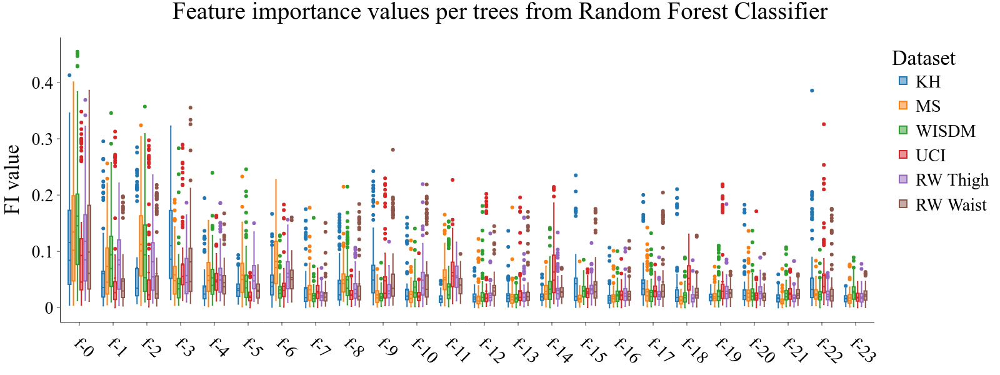

In [21]:
# Let's create a boxplot to compare the feature importance values from each tree of the random forest
save_results = False
for reduce, df in results.groupby(["Reduce on"]):
    fig = px.box(
        df,
        y=features,
        color="Dataset",
        template="simple_white",
    )
    fig.update_traces(boxmean=True)
    fig.update_layout(
        title=f"Feature importance values per trees from Random Forest Classifier",
        xaxis_title=None,
        yaxis_title="FI value",
        font=dict(
            family="Serif",
            size=18,
            color="black",
        ),
        width=1600,
        height=600,
    )

    fig.update_layout(
        {
            "plot_bgcolor": "rgba(0, 0, 0, 0)",
            "paper_bgcolor": "rgba(0, 0, 0, 0)",
        }
    ) if transparency == False else None

    # Center the title
    fig.update_layout(title_x=0.5, font_size=28)
    # Change the bar mode
    fig.update_layout(barmode="group", xaxis_tickangle=45)
    fig.show("png")
    fig.write_image(
        f"{path_to_save_results}/feature_importance_values_per_tree_{reduce[0]}.pdf"
    )  if save_results else None
    # Verificar a média dos boxplot com os valores feature importance do Random Forest

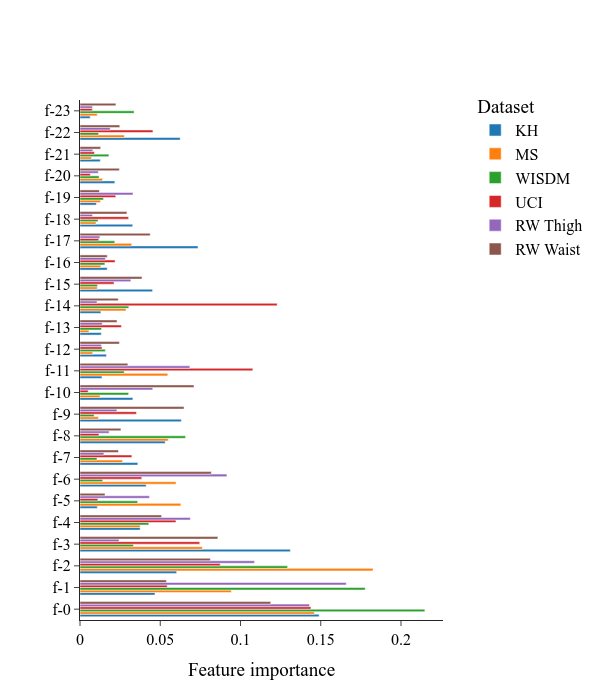

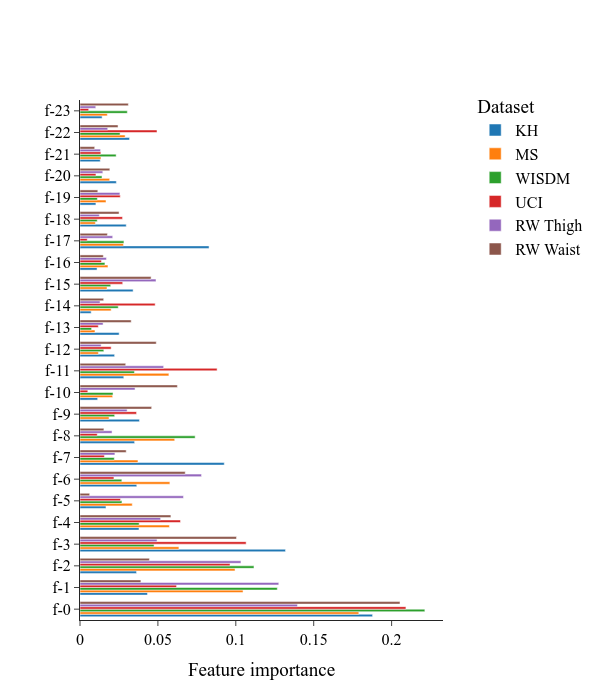

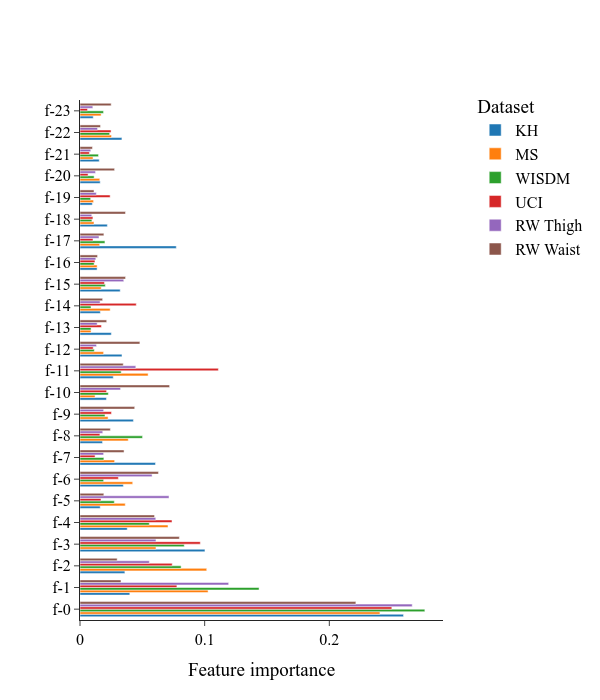

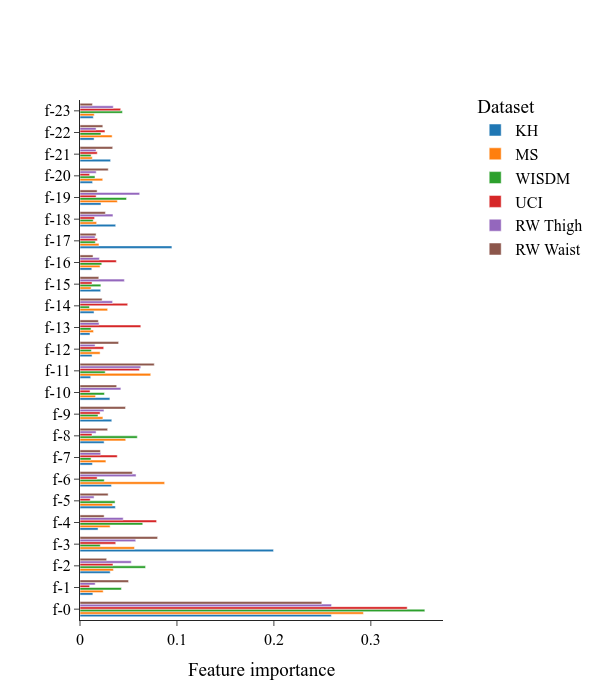

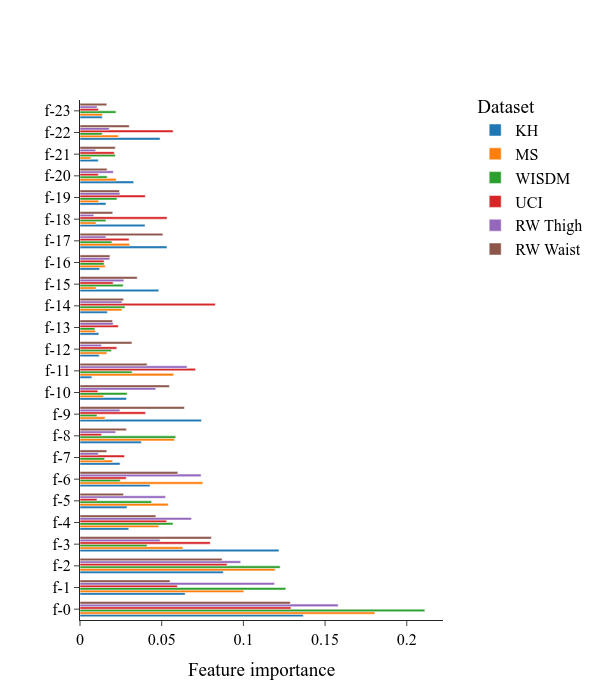

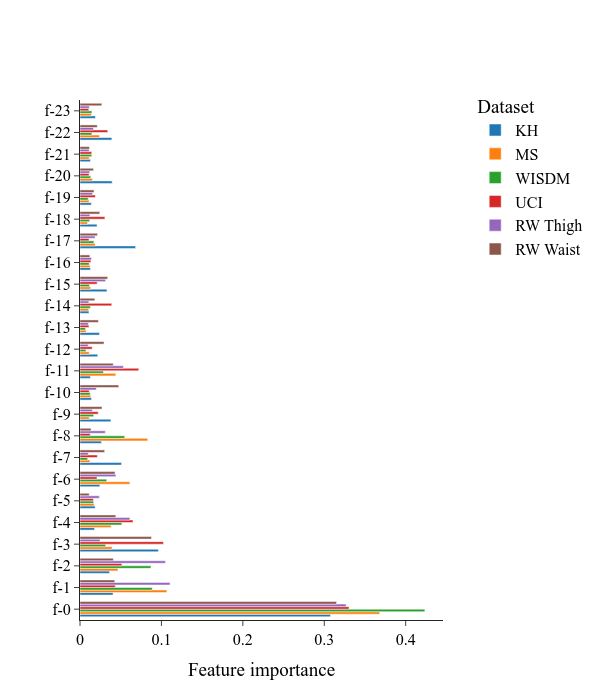

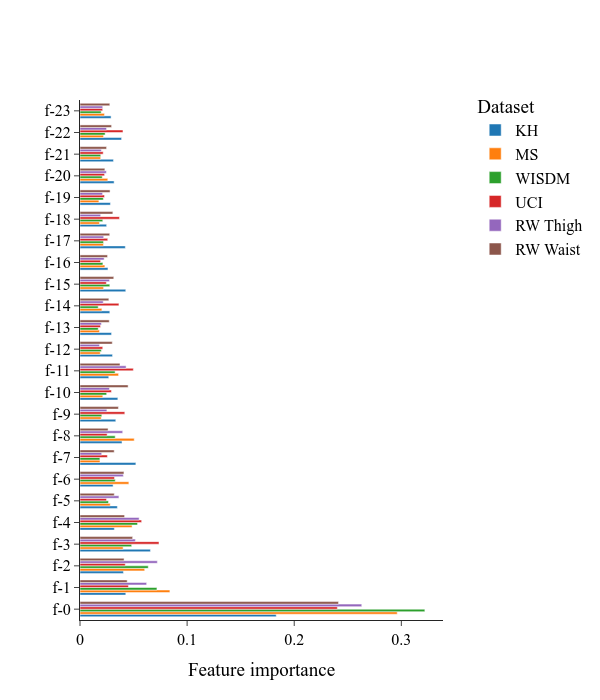

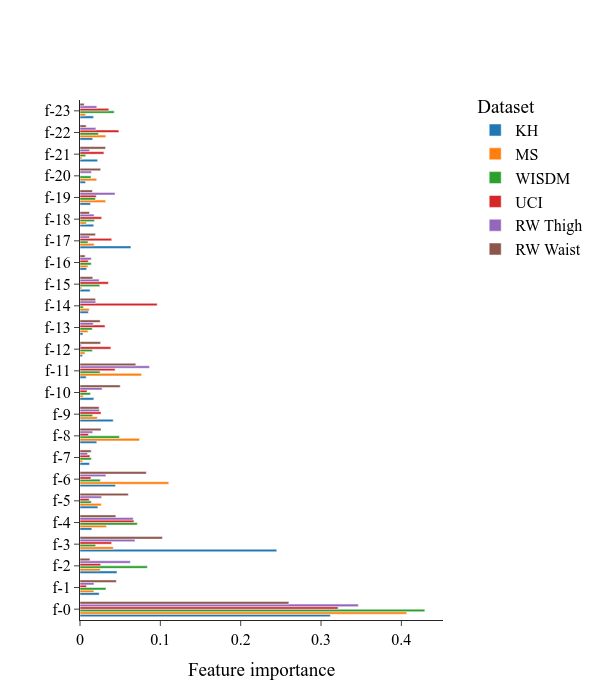

In [22]:
### TODO
# for each reduce
#  for each ML model
#   for each xAI in "Lime", "Shap"
#     plot the feature importance values of the ML model trained with each dataset (one bar per dataset)

# Let's read the feature importance values by RandomForest
# path = "df_features_rf.pickle"
# df_features_rf = pickle.load(open(path, "rb"))
save_results = False
classifiers = ["Random Forest", "SVM", "KNN", "Decision Tree"]
features = [f"f-{i}" for i in range(24)]

reduce_on = ["axis", "sensor", "all"]

df_lime = df_lime_per_feature.copy()
df_lime["XAI"] = "LIME"
df_lime = normilize_l1(df_lime, features)

df_shap = df_shap_values_per_feature.copy()
df_shap["XAI"] = "SHAP"
df_shap = normilize_l1(df_shap, features)

df_rf = df_features_rf.copy()
df_rf["XAI"] = "Random Forest"
df_rf = normilize_l1(df_rf, features)

df_oracle = df_features_oracle.copy()
df_oracle["XAI"] = "Oracle"
df_oracle = normilize_l1(df_oracle, features)

include_RF_FI = False

# for reduce in ["all"]:  # reduce_on:# [:1]: # reduce_on:
#     for raw_df, xai_str in [
#         (df_shap, "SHAP"),
#         (df_lime, "LIME"),
#     ]:  # (df_oracle, "Oracle") ]: # , (df_rf, "RF") ]:
#         for classifier in ["Random Forest", "SVM", "KNN", "Decision Tree"]:
              
lst_df_xai = [(df_lime, "LIME"), (df_shap, "SHAP")]

for reduce, (raw_df, xai_str), classifier in product(
    ["all"], lst_df_xai, classifiers
):
    df = raw_df[
        (raw_df["Classifier"] == classifier)
        & (raw_df["reduce on"] == reduce)
        & (raw_df["XAI"] == xai_str)
        & (raw_df["Train"] == raw_df["Test"])
    ]
    most_import_features = (
        df[df["Train"] == "MS"][features].values[0].argsort()[::-1]
    )
    reversed_most_import_features = most_import_features[::-1]
    # most_import_features = features
    # features = np.array(features)[reversed_most_import_features].tolist()

    features = np.array(features).tolist()

    go_bars = []
    for dataset in datasets_renamed:
        go_bars.append(
            go.Bar(
                name=dataset,
                y=features,
                x=df[(df["Train"] == dataset)][features].values[0],
                orientation="h",
            )
        )

    fig = go.Figure(data=go_bars)
    fig.update_layout(
        # title=f"{xai_str} feature importance values for {classifier} classifier",
        yaxis_title=None,
        xaxis_title="Feature importance",
        font=dict(
            family="Serif",
            size=16,
            color="black",
        ),
        width=600,
        height=700,
        barmode="group",
        bargap=0.3,
        legend_title="Dataset",
        template="simple_white",
        legend=dict(
            orientation="v",
            yanchor="bottom",
            y=.68,
            xanchor="right",
            x=1.4,
            # font_size=16,
        ),
    )
    fig.update_layout(
        {
            "plot_bgcolor": "rgba(0, 0, 0, 0)",
            "paper_bgcolor": "rgba(0, 0, 0, 0)",
        }
    ) if transparency == False else None
    # Center the title
    fig.update_layout(title_x=0.5, title_y=0.95)
    fig.show("png")
    fig.write_image(
        f"{path_to_save_results}/feature_importance_values_per_feature_{classifier}_{xai_str}_{reduce}-sorted_by_motionsense.pdf"
    )  if save_results else None

['KH' 'MS' 'WISDM' 'UCI' 'RW Thigh' 'RW Waist']


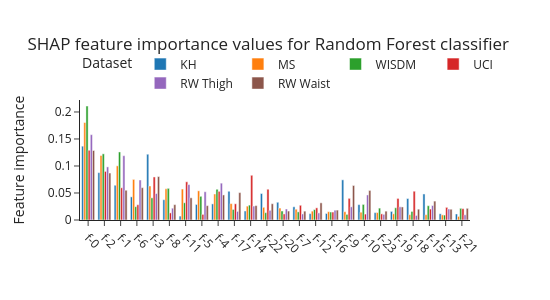

['KH' 'MS' 'WISDM' 'UCI' 'RW Thigh' 'RW Waist']


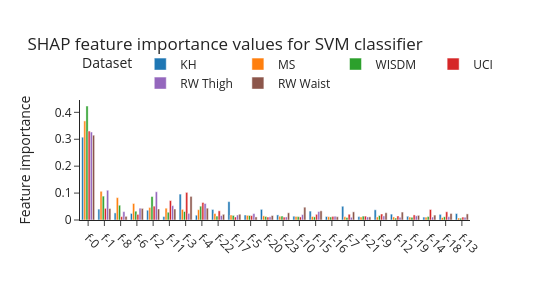

['KH' 'MS' 'WISDM' 'UCI' 'RW Thigh' 'RW Waist']


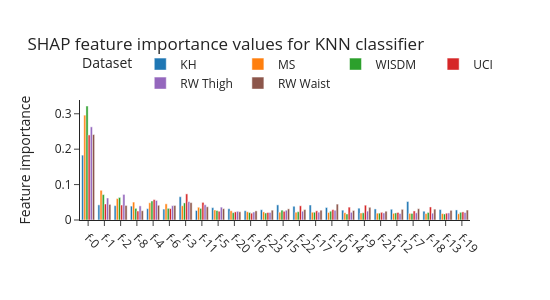

['KH' 'MS' 'WISDM' 'UCI' 'RW Thigh' 'RW Waist']


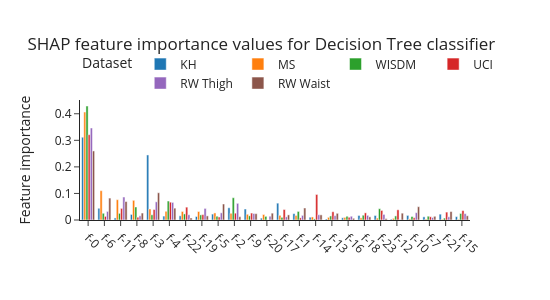

['KH' 'MS' 'WISDM' 'UCI' 'RW Thigh' 'RW Waist']


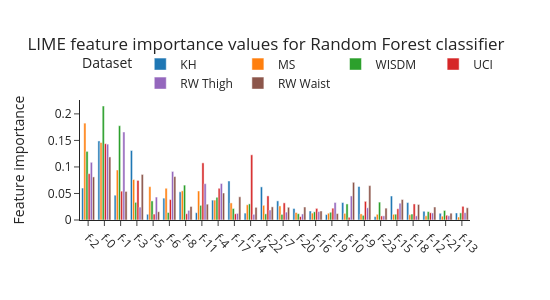

['KH' 'MS' 'WISDM' 'UCI' 'RW Thigh' 'RW Waist']


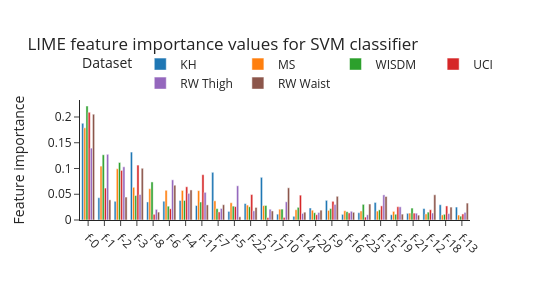

['KH' 'MS' 'WISDM' 'UCI' 'RW Thigh' 'RW Waist']


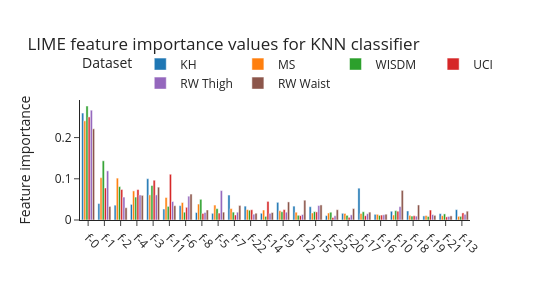

['KH' 'MS' 'WISDM' 'UCI' 'RW Thigh' 'RW Waist']


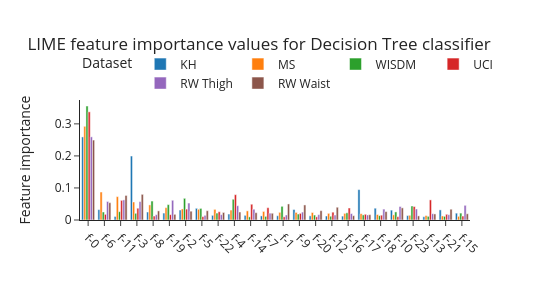

In [23]:
### TODO
# for each reduce
#  for each ML model
#   for each xAI in "Lime", "Shap"
#     plot the feature importance values of the ML model trained with each dataset (one bar per dataset)

# Let's read the feature importance values by RandomForest
# path = "df_features_rf.pickle"
# df_features_rf = pickle.load(open(path, "rb"))
save_results = False
classifiers = ["Random Forest", "SVM", "KNN", "Decision Tree"]
features = [f"f-{i}" for i in range(24)]

reduce_on = ["axis", "sensor", "all"]

df_lime = df_lime_per_feature.copy()
df_lime["XAI"] = "LIME"
df_lime = normilize_l1(df_lime, features)

df_shap = df_shap_values_per_feature.copy()
df_shap["XAI"] = "SHAP"
df_shap = normilize_l1(df_shap, features)

df_rf = df_features_rf.copy()
df_rf["XAI"] = "Random Forest"
df_rf = normilize_l1(df_rf, features)

df_oracle = df_features_oracle.copy()
df_oracle["XAI"] = "Oracle"
df_oracle = normilize_l1(df_oracle, features)

include_RF_FI = False

for reduce in ["all"]:  # reduce_on:# [:1]: # reduce_on:
    for raw_df, xai_str in [
        (df_shap, "SHAP"),
        (df_lime, "LIME"),
    ]:  # (df_oracle, "Oracle") ]: # , (df_rf, "RF") ]:
        for classifier in ["Random Forest", "SVM", "KNN", "Decision Tree"]:
            df = raw_df[
                (raw_df["Classifier"] == classifier)
                & (raw_df["reduce on"] == reduce)
                & (raw_df["XAI"] == xai_str)
                & (raw_df["Train"] == raw_df["Test"])
            ]
            print(df["Train"].unique())
            most_import_features = (
                df[df["Train"] == "MS"][features].values[0].argsort()[::-1]
            )
            # most_import_features = features
            features = np.array(features)[most_import_features].tolist()

            go_bars = []
            for dataset in datasets_renamed:
                go_bars.append(
                    go.Bar(
                        name=dataset,
                        x=features,
                        y=df[(df["Train"] == dataset)][features].values[0],
                    )
                )

            fig = go.Figure(data=go_bars)
            fig.update_layout(
                title=f"{xai_str} feature importance values for {classifier} classifier",
                xaxis_title=None,
                yaxis_title="Feature importance",
                font=dict(
                    # family="Courier New, monospace",
                    # size=6,
                    size=12,
                    # color="RebeccaPurple"
                ),
                width=550,
                height=300,
                barmode="group",
                bargap=0.2,
                # legend_title="Training Dataset",
                legend_title="Dataset",
                template="simple_white",
            )
            fig.update_layout(
                {
                    "plot_bgcolor": "rgba(0, 0, 0, 0)",
                    "paper_bgcolor": "rgba(0, 0, 0, 0)",
                }
            ) if transparency == False else None
            # Rotate the x axis labels
            fig.update_xaxes(tickangle=45)
            # Change the legend position to above the title
            fig.update_layout(legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="left", x=0.0, font_size=12))
            fig.show("png")
            fig.write_image(
                f"{path_to_save_results}/feature_importance_values_per_feature_{classifier}_{xai_str}_{reduce}-sorted_by_motionsense.pdf"
            ) if save_results else None

In [24]:
path = "../../experiments/XAI/Remove_features/KPCA_results/feature_importance_remove_worst"
features = [f"f {i}" for i in range(24)]
dfs = []

xai_dict = {
    "lime": "LIME",
    "shap": "SHAP",
    "oracle": "ORACLE",
    "forest": "Random Forest",
    "tree": "Decision Tree",
}

dfs = []

# Read all files that finish with .csv
for file in os.listdir(path):
    if file.endswith(".csv"):
        df = pd.read_csv(os.path.join(path, file))
        dfs.append(df)

df = pd.concat(dfs)

resumed_df_worst = df.copy()
# Remove XAI == "ORACLE"
resumed_df_worst = resumed_df_worst[resumed_df_worst["XAI"] != "ORACLE"]

resumed_df_worst["Train"] = resumed_df_worst["Train"].replace(datasets_dict)
resumed_df_worst["Test"] = resumed_df_worst["Test"].replace(datasets_dict)
resumed_df_worst["XAI"] = resumed_df_worst["XAI"].replace(xai_dict)
resumed_df_worst = resumed_df_worst[resumed_df_worst["Reduce"] == "all"]
resumed_df_worst["N removed Features"] = 24 - resumed_df_worst["Dimension"]
resumed_df_worst = resumed_df_worst[resumed_df_worst["Train"] == resumed_df_worst["Test"]]
resumed_df_worst["Dataset"] = resumed_df_worst["Train"]
resumed_df_worst.drop(["Train", "Test"], axis=1, inplace=True)
resumed_df_worst = resumed_df_worst.sort_values(by=["Dataset", "N removed Features"])
resumed_df_worst.reset_index(inplace=True, drop=True)

resumed_df_worst

,Classifier,Reduce,XAI,Accuracy,F1-Score,Dimension,Feature Removed,N removed Features,Dataset
0,Decision Tree,all,SHAP,0.779762,0.776349,24,12,0,KH
1,Decision Tree,all,LIME,0.779762,0.776349,24,13,0,KH
2,Random Forest,all,Random Forest,0.833333,0.828983,24,11,0,KH
3,SVM,all,SHAP,0.714286,0.655735,24,21,0,KH
4,KNN,all,LIME,0.839286,0.836459,24,19,0,KH
...,...,...,...,...,...,...,...,...,...
1435,KNN,all,LIME,0.592857,0.594805,1,0,23,WISDM
1436,Random Forest,all,SHAP,0.557143,0.563558,1,0,23,WISDM
1437,SVM,all,SHAP,0.592857,0.528557,1,0,23,WISDM
1438,Decision Tree,all,LIME,0.557143,0.563558,1,0,23,WISDM


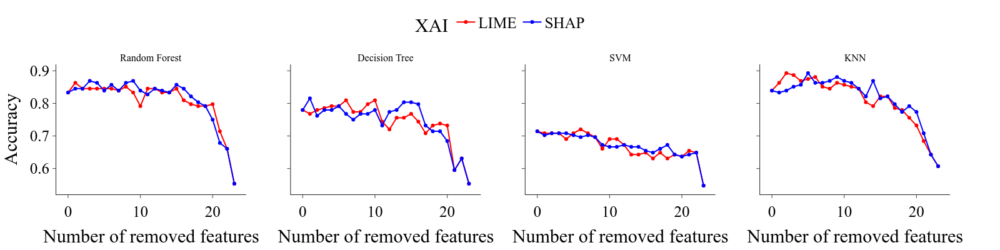

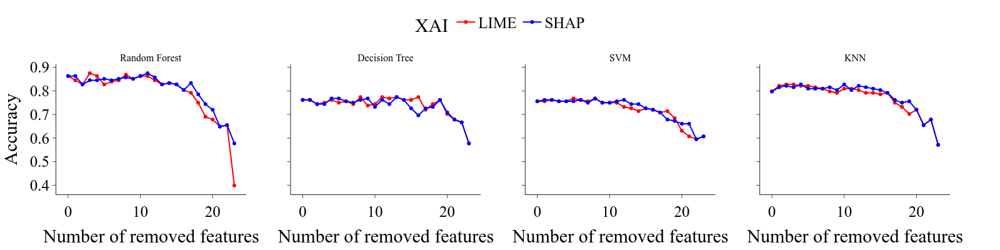

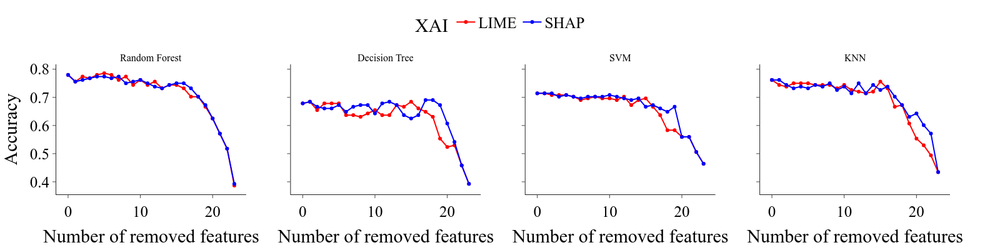

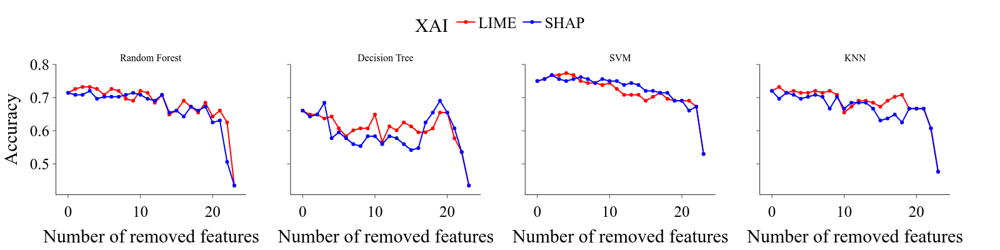

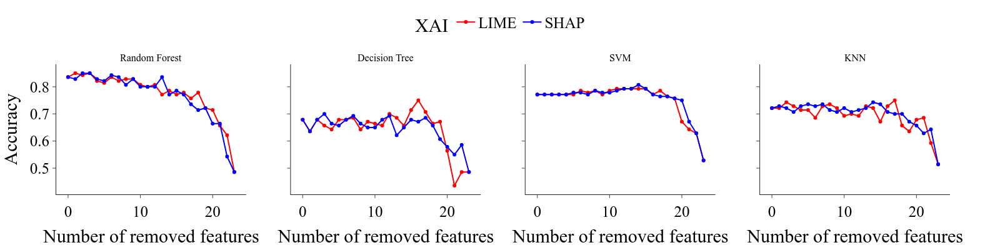

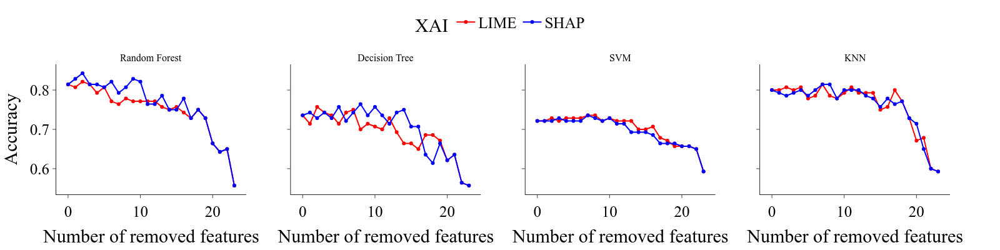

In [25]:
color_discrete_map = {
    "LIME": "red",
    "SHAP": "blue",
    "Random Forest": "green",
    "ORACLE": "black",
    "Tree": "orange",}
symbol_map = {
    "LIME": "star-open",
    "SHAP": "x-open",
    "Random Forest": "diamond-open",
    "ORACLE": "circle",
    "Tree": "triangle-up-open",
}
# Change the size of the symbols for each XAI
size_xai = 6
symbol_size_map = {
    "LIME": size_xai,
    "SHAP": size_xai,
    "Random Forest": size_xai,
    "ORACLE": size_xai,
    "Tree": size_xai,
}

rows = len(resumed_df_worst["Reduce"].unique())
cols = len(resumed_df_worst["Dataset"].unique())

df = resumed_df_worst.copy()

# Invert the order of dimensions
df["N removed Features"] = df["Dimension"].apply(lambda x: 24 - x)

df.sort_values(by=["Dimension", "XAI"], inplace=True)
df = df[df["Reduce"] == "all"]

classifiers = ["Random Forest", "Decision Tree", "SVM", "KNN"]
# xai_lst = ["Tree", "LIME", "SHAP", "Random Forest"]
xai_lst = ["LIME", "SHAP",]

for (dataset, sub_df) in df.groupby(["Dataset"]):

    fig = make_subplots(rows=1, cols=4, subplot_titles=classifiers, shared_yaxes=True)

    for (xai_str, classifier) in product(xai_lst, classifiers):
        col = classifiers.index(classifier) + 1
        fig.add_trace(
            go.Scatter(
                name=xai_str,
                x=sub_df[(sub_df["XAI"] == xai_str) & (sub_df["Classifier"] == classifier)]["N removed Features"],
                y=sub_df[(sub_df["XAI"] == xai_str) & (sub_df["Classifier"] == classifier)]["Accuracy"],
                mode="markers+lines" if xai_str != "Others" else "markers",
                marker=dict(
                    color=color_discrete_map[xai_str],
                    # symbol=symbol_map[xai_str],
                    # size=symbol_size_map[xai_str],
                ),
                showlegend=True if col == 1 or xai_str == "Tree" else False,
            ),
            row=1,
            col=col,
            # Resize the title
        )
        max_acc = sub_df[sub_df["Classifier"] == classifier]["Accuracy"].max()
        # Resize the title
        # fig.update_layout(title_x=0.5, title_y=0.95, font_size=40)
        # Take the third quartile of the accuracy
        # quartile_3 = sub_df[sub_df["Classifier"] == classifier]["Accuracy"].quantile(0.9)
        num_features_removed = sub_df[(sub_df["Classifier"] == classifier) & (sub_df["Accuracy"] == max_acc)]["N removed Features"].values[0]
        # num_features_removed = sub_df[(sub_df["Classifier"] == classifier) & (sub_df["Accuracy"] >= quartile_3)]["N removed Features"].values[0]

        # Add a vertical line to indicate the number of features removed when the accuracy is the highest for each XAI
        # fig.add_shape(
        #     type="line",
        #     x0=num_features_removed,
        #     y0=0,
        #     x1=num_features_removed,
        #     y1=1,
        #     line=dict(
        #         color="black",
        #         width=1,
        #         dash="dash",
        #     ),
        #     row=1,
        #     col=col,
        # )

    # Add xaxis_title for all subplots
    for col in range(1, 5):
        fig.update_xaxes(
            # title_text="Number of removed features",
            row=1,
            col=col,
        )

    fig.update_layout(
        # title=f"Performance of models - {dataset[0]} dataset - Remove worst features",
        title="",
        # xaxis_title="Number of removed features",
        yaxis_title="Accuracy",
        font=dict(
            family="Serif",
            size=25,
            color="black",
        ),
        width=1600,
        height=400,
        legend_title="XAI",
        template="simple_white",
    )
    # Move the legend to the center
    fig.update_layout(legend=dict(orientation="h", yanchor="bottom", y=1.2, xanchor="left", x=0.4))
    # fig.update_layout(
    #     {
    #         "plot_bgcolor": "rgba(0, 0, 0, 0)",
    #         "paper_bgcolor": "rgba(0, 0, 0, 0)",
    #     }
    # )

    # Add x axis title
    fig.update_xaxes(title_text="Number of removed features", row=1, col=1)
    fig.update_xaxes(title_text="Number of removed features", row=1, col=2)
    fig.update_xaxes(title_text="Number of removed features", row=1, col=3)
    fig.update_xaxes(title_text="Number of removed features", row=1, col=4)
    
    # Center the title
    fig.update_layout(title_x=0.5)
    fig.write_image(
        f"{path_to_save_results}/feature_importance_remove_worst_{dataset[0]}.pdf"
    )  #  if save_results else None
    fig.show("png")

In [26]:
path = "../../experiments/XAI/Remove_features/KPCA_results/feature_importance_remove_best"
features = [f"f {i}" for i in range(24)]
dfs = []

xai_dict = {
    "lime": "LIME",
    "shap": "SHAP",
    "oracle": "ORACLE",
    "forest": "Random Forest",
    "tree": "Decision Tree",
}

dfs = []

# Read all files that finish with .csv
for file in os.listdir(path):
    if file.endswith(".csv"):
        df = pd.read_csv(os.path.join(path, file))
        dfs.append(df)

df = pd.concat(dfs)

resumed_df_best = df.copy()
# Remove XAI == "ORACLE"
resumed_df_best = resumed_df_best[resumed_df_best["XAI"] != "ORACLE"]

resumed_df_best["Train"] = resumed_df_best["Train"].replace(datasets_dict)
resumed_df_best["Test"] = resumed_df_best["Test"].replace(datasets_dict)
resumed_df_best["XAI"] = resumed_df_best["XAI"].replace(xai_dict)
resumed_df_best = resumed_df_best[resumed_df_best["Reduce"] == "all"]
resumed_df_best["N removed Features"] = 24 - resumed_df_best["Dimension"]
resumed_df_best = resumed_df_best[resumed_df_best["Train"] == resumed_df_best["Test"]]
resumed_df_best["Dataset"] = resumed_df_best["Train"]
resumed_df_best.drop(["Train", "Test"], axis=1, inplace=True)
resumed_df_best = resumed_df_best.sort_values(by=["Dataset", "N removed Features"])
resumed_df_best.reset_index(inplace=True, drop=True)

resumed_df_best

,Classifier,Reduce,XAI,Accuracy,F1-Score,Dimension,Feature Removed,N removed Features,Dataset
0,Decision Tree,all,SHAP,0.779762,0.776349,24,0,0,KH
1,Decision Tree,all,LIME,0.779762,0.776349,24,0,0,KH
2,Random Forest,all,Random Forest,0.833333,0.828983,24,0,0,KH
3,SVM,all,SHAP,0.714286,0.655735,24,0,0,KH
4,KNN,all,LIME,0.839286,0.836459,24,0,0,KH
...,...,...,...,...,...,...,...,...,...
1435,KNN,all,LIME,0.471429,0.466411,1,13,23,WISDM
1436,Random Forest,all,SHAP,0.364286,0.358920,1,13,23,WISDM
1437,SVM,all,SHAP,0.357143,0.297065,1,13,23,WISDM
1438,Decision Tree,all,LIME,0.364286,0.358920,1,13,23,WISDM


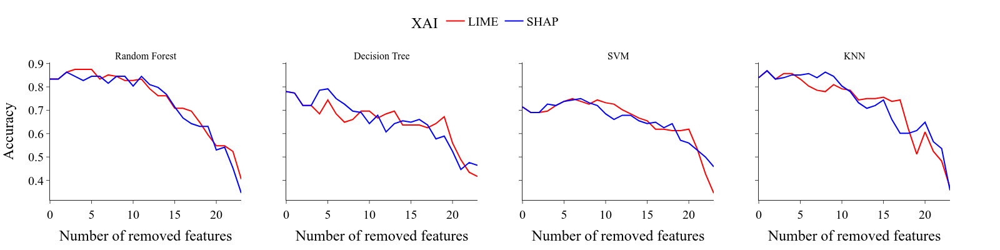

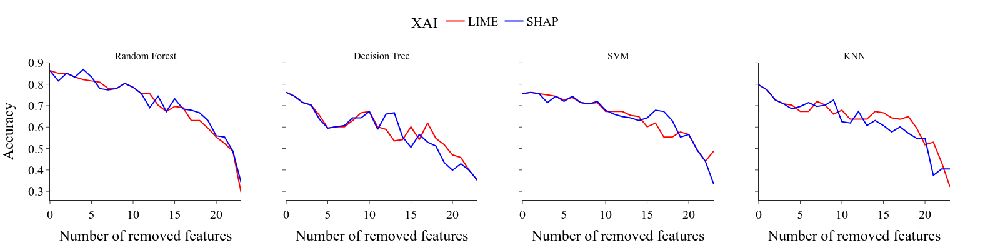

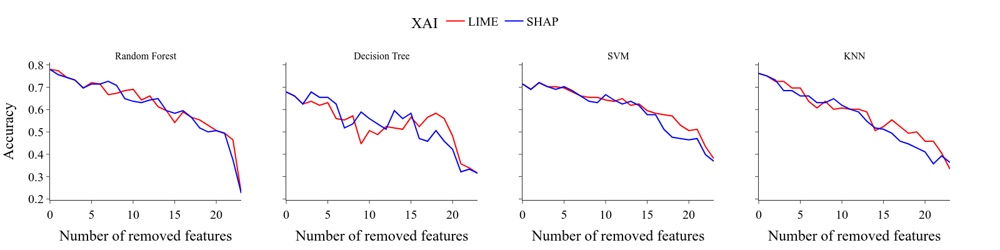

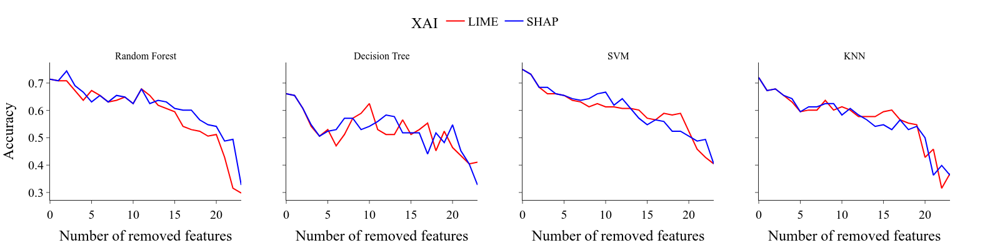

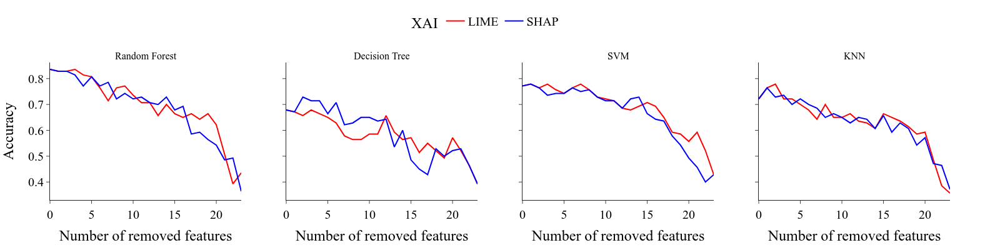

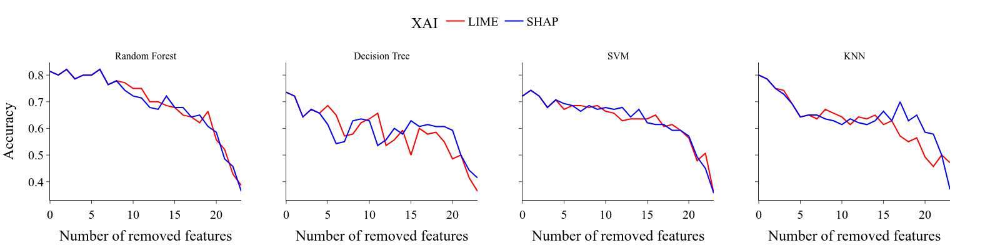

In [27]:
color_discrete_map = {
    "LIME": "red",
    "SHAP": "blue",
    "Random Forest": "green",
    "ORACLE": "black",
    "Tree": "orange",}
symbol_map = {
    "LIME": "star-open",
    "SHAP": "x-open",
    "Random Forest": "diamond-open",
    "ORACLE": "circle",
    "Tree": "triangle-up-open",
}
# Change the size of the symbols for each XAI
size_xai = 6
symbol_size_map = {
    "LIME": size_xai,
    "SHAP": size_xai,
    "Random Forest": size_xai,
    "ORACLE": size_xai,
    "Tree": size_xai,
}

rows = len(resumed_df_best["Reduce"].unique())
cols = len(resumed_df_best["Dataset"].unique())

df = resumed_df_best.copy()

# Invert the order of dimensions
df["N removed Features"] = df["Dimension"].apply(lambda x: 24 - x)

df.sort_values(by=["Dimension", "XAI"], inplace=True)
df = df[df["Reduce"] == "all"]

classifiers = ["Random Forest", "Decision Tree", "SVM", "KNN"]
# xai_lst = ["Tree", "LIME", "SHAP", "Random Forest"]
xai_lst = ["LIME", "SHAP",]

for (dataset, sub_df) in df.groupby(["Dataset"]):

    fig = make_subplots(rows=1, cols=4, subplot_titles=classifiers, shared_yaxes=True)

    for (xai_str, classifier) in product(xai_lst, classifiers):
        col = classifiers.index(classifier) + 1
        fig.add_trace(
            go.Scatter(
                name=xai_str,
                x=sub_df[(sub_df["XAI"] == xai_str) & (sub_df["Classifier"] == classifier)]["N removed Features"],
                y=sub_df[(sub_df["XAI"] == xai_str) & (sub_df["Classifier"] == classifier)]["Accuracy"],
                mode="lines",
                marker=dict(
                    color=color_discrete_map[xai_str],
                    # symbol=symbol_map[xai_str],
                    # size=symbol_size_map[xai_str],
                ),
                showlegend=True if col == 1 or xai_str == "Tree" else False,
            ),
            row=1,
            col=col,
        )
        max_acc = sub_df[sub_df["Classifier"] == classifier]["Accuracy"].max()
        num_features_removed = sub_df[(sub_df["Classifier"] == classifier) & (sub_df["Accuracy"] == max_acc)]["N removed Features"].values[0]

    # Add xaxis_title for all subplots
    for col in range(1, 5):
        fig.update_xaxes(
            # title_text="Number of removed features",
            row=1,
            col=col,
        )

    fig.update_layout(
        yaxis_title="Accuracy",
        font=dict(
            family="Serif",
            size=20,
            color="black",
        ),
        width=1600,
        height=400,
        legend_title="XAI",
        template="simple_white",
    )

    # Add x axis title
    fig.update_xaxes(title_text="Number of removed features", row=1, col=1)
    fig.update_xaxes(title_text="Number of removed features", row=1, col=2)
    fig.update_xaxes(title_text="Number of removed features", row=1, col=3)
    fig.update_xaxes(title_text="Number of removed features", row=1, col=4)
    
    # Move the legend to the center
    fig.update_layout(legend=dict(orientation="h", yanchor="bottom", y=1.2, xanchor="left", x=0.4))

    # Center the title
    fig.update_layout(title_x=0.5)
    fig.write_image(
        f"{path_to_save_results}/feature_importance_remove_best_{dataset[0]}.pdf"
    )  #  if save_results else None
    fig.show("png")

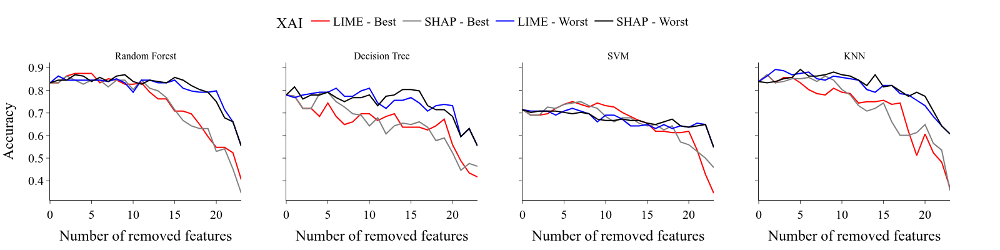

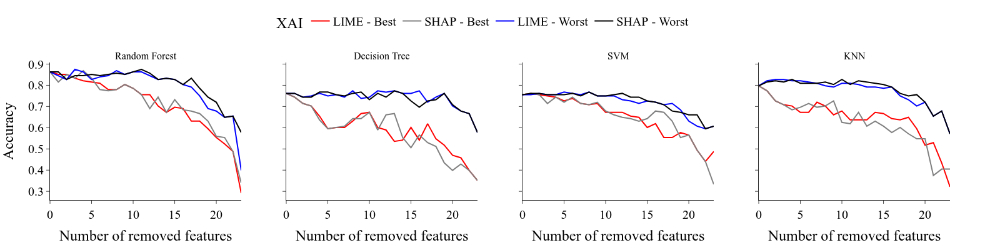

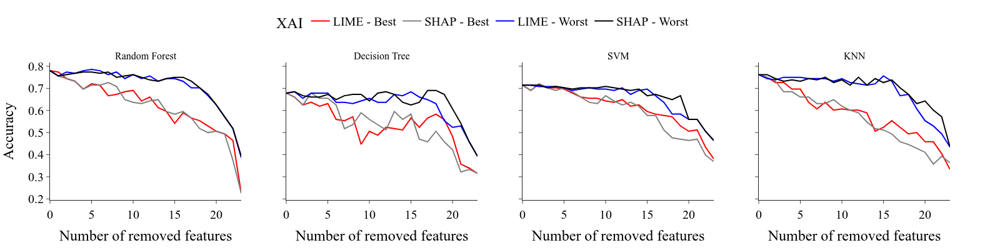

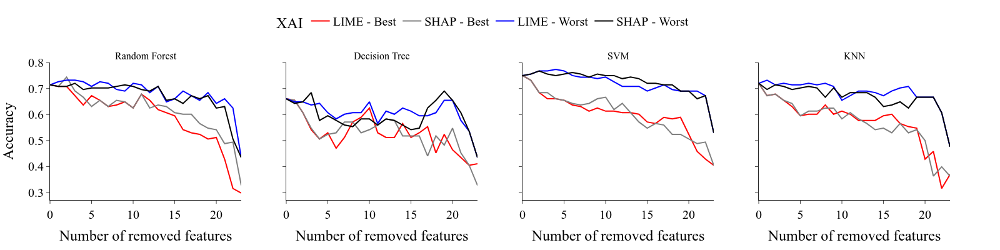

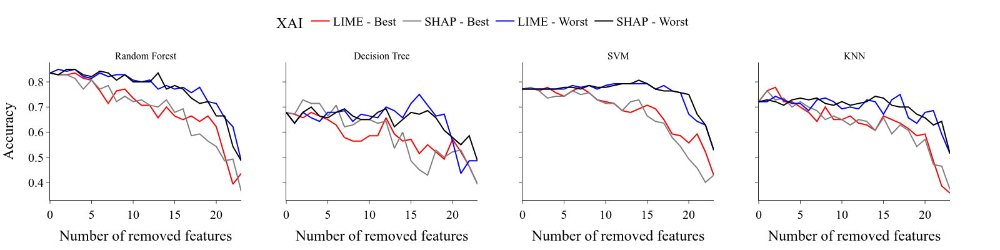

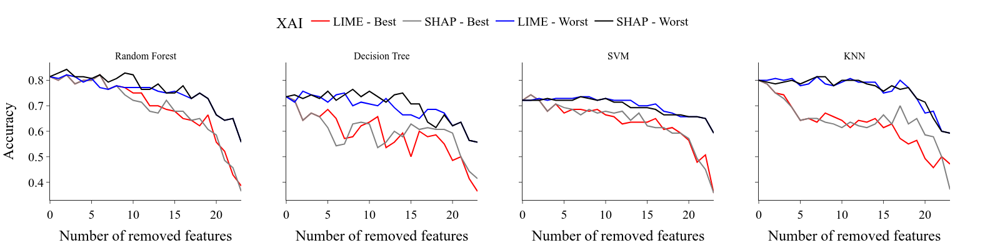

In [28]:
save_results = True
color_discrete_map = {
    "LIME - Worst": "blue",
    "SHAP - Worst": "black",
    "LIME - Best": "red",
    "SHAP - Best": "grey",
}
symbol_map = {
    "LIME - Best": "star-open",
    "SHAP - Best": "x-open",
    "LIME - Worst": "star",
    "SHAP - Worst": "x",
}
# Change the size of the symbols for each XAI
size_xai = 6

rows = len(resumed_df_best["Reduce"].unique())
cols = len(resumed_df_best["Dataset"].unique())

df_best = resumed_df_best.copy()
df_worst = resumed_df_worst.copy()

# Invert the order of dimensions
df_best["N removed Features"] = df_best["Dimension"].apply(lambda x: 24 - x)
df_worst["N removed Features"] = df_worst["Dimension"].apply(lambda x: 24 - x)

df_best.sort_values(by=["Dimension", "XAI"], inplace=True)
df_best = df_best.replace("LIME", "LIME - Best")
df_best = df_best.replace("SHAP", "SHAP - Best")
df_best = df_best[df_best["Reduce"] == "all"]

df_worst.sort_values(by=["Dimension", "XAI"], inplace=True)
df_worst = df_worst.replace("LIME", "LIME - Worst")
df_worst = df_worst.replace("SHAP", "SHAP - Worst")
df_worst = df_worst[df_worst["Reduce"] == "all"]

classifiers = ["Random Forest", "Decision Tree", "SVM", "KNN"]
xai_lst = ["LIME - Best", "SHAP - Best", "LIME - Worst", "SHAP - Worst"]

for dataset in df_best['Dataset'].unique():
    sub_df_best = df_best[df_best["Dataset"] == dataset]
    sub_df_worst = df_worst[df_worst["Dataset"] == dataset]

    fig = make_subplots(rows=1, cols=4, subplot_titles=classifiers, shared_yaxes=True)

    for (xai_str, classifier) in product(xai_lst, classifiers):
        col = classifiers.index(classifier) + 1
        fig.add_trace(
            go.Scatter(
                name=xai_str,
                x=sub_df_best[(sub_df_best["XAI"] == xai_str) & (sub_df_best["Classifier"] == classifier)]["N removed Features"],
                y=sub_df_best[(sub_df_best["XAI"] == xai_str) & (sub_df_best["Classifier"] == classifier)]["Accuracy"],
                mode="lines",
                marker=dict(
                    color=color_discrete_map[xai_str],
                    # symbol=symbol_map[xai_str],
                    # size=symbol_size_map[xai_str],
                ),
                showlegend=True if col == 1 or xai_str == "Tree" else False,
            ),
            row=1,
            col=col,
        )
        max_acc = sub_df_best[sub_df_best["Classifier"] == classifier]["Accuracy"].max()
        num_features_removed = sub_df_best[(sub_df_best["Classifier"] == classifier) & (sub_df_best["Accuracy"] == max_acc)]["N removed Features"].values[0]

    for (xai_str, classifier) in product(xai_lst, classifiers):
        col = classifiers.index(classifier) + 1
        fig.add_trace(
            go.Scatter(
                name=xai_str,
                x=sub_df_worst[(sub_df_worst["XAI"] == xai_str) & (sub_df_worst["Classifier"] == classifier)]["N removed Features"],
                y=sub_df_worst[(sub_df_worst["XAI"] == xai_str) & (sub_df_worst["Classifier"] == classifier)]["Accuracy"],
                mode="lines",
                marker=dict(
                    color=color_discrete_map[xai_str],
                    # symbol=symbol_map[xai_str],
                    # size=symbol_size_map[xai_str],
                ),
                showlegend=True if col == 1 or xai_str == "Tree" else False,
            ),
            row=1,
            col=col,
        )
        max_acc = sub_df_worst[sub_df_worst["Classifier"] == classifier]["Accuracy"].max()
        num_features_removed = sub_df_worst[(sub_df_worst["Classifier"] == classifier) & (sub_df_worst["Accuracy"] == max_acc)]["N removed Features"].values[0]


    # Add xaxis_title for all subplots
    for col in range(1, 5):
        fig.update_xaxes(
            # title_text=f"Dataset: {dataset}",
            row=1,
            col=col,
        )

    fig.update_layout(
        yaxis_title="Accuracy",
        # title=f"Dataset: {dataset}",
        font=dict(
            family="Serif",
            size=20,
            color="black",
        ),
        width=1600,
        height=400,
        legend_title="XAI",
        template="simple_white",
    )

    # Move the legend to the center
    fig.update_layout(legend=dict(orientation="h", yanchor="bottom", y=1.2, xanchor="left", x=0.25))

    # Add x axis title
    fig.update_xaxes(title_text="Number of removed features", row=1, col=1)
    fig.update_xaxes(title_text="Number of removed features", row=1, col=2)
    fig.update_xaxes(title_text="Number of removed features", row=1, col=3)
    fig.update_xaxes(title_text="Number of removed features", row=1, col=4)

    # Center the title
    fig.update_layout(title_x=0.03)
    fig.write_image(
        f"{path_to_save_results}/feature_importance_remove_best_worst_{dataset}.pdf"
    )  if save_results else None

    fig.show("png")